# Deep Learning in Medicine Spring 2025

## Homework 3 - Sequence modeling

Hi! This homework aims to let you get acquianted with how sequence modelling in Deep Learning can be utilized for the biology domain. 

We will be utilizing existing public datasets and performing 4 separate steps with Torch.

Our data is related to enhancers, genomic elements which can alter the levels of gene expression.

There are 4 tasks:

1. RNNs/LSTMs for sequence modelling - You will be tasked to utilize existing PyTorch infrastructure and LSTMs to perform sequence classification (40 points).

2. Transformers - Implement a transformer with a classification head, compare and contrast with the LSTM architecture in terms of accuracy, memory requirements, and runtime. (40 points).

3. Hyperparameter optimization - Use one of your two Transformers alongside a hyperparameter optimization library to explore different hyperparameter and potentially increase performance. (30 points).

4. Extracting and exploring embeddings from pre-trained SSL models - Do the big models truly understand what is an enhancer? If so, their latent representations of such sequences should be meaningful. (30 points).

The maximum you can get for the whole homework is 140. This means that you can choose to solve two assignments fully and one partially depending on your interests and/or familiarity.




### Dataset loading

Make sure you install the [https://github.com/ML-Bioinfo-CEITEC/genomic_benchmarks](genomic-benchmarks) package with ```pip install genomic-benchmarks```. Make sure your gdown package is updated!

#### Explore the dataset

In [1]:
import warnings
import requests
from genomic_benchmarks.data_check import list_datasets
from genomic_benchmarks.data_check import info
from genomic_benchmarks.loc2seq import download_dataset

requests.packages.urllib3.disable_warnings()

warnings.filterwarnings("ignore", category=UserWarning)  # Example for suppressing UserWarnings

info('human_enhancers_ensembl')

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/genomic_benchmarks/utils/datasets.py:11: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


TypeError: Constructor parameter should be str

As you can see the dataset is quite large, so make sure you have GPU access when using it.

#### Download the dataset

In [ ]:
 download_dataset("human_enhancers_ensembl") #51MB zipped, 600 MB full

#### Load the dataset

Luckily the repository gives us ample instructions on how to load the dataset

In [ ]:
from genomic_benchmarks.dataset_getters.pytorch_datasets import HumanEnhancersEnsembl
train = HumanEnhancersEnsembl(split='train', version=0)
test = HumanEnhancersEnsembl(split='test', version=0)

In [2]:
if torch.cuda.is_available():
    print("GPU is available!")
    print(f"GPU name: {torch.cuda.get_device_name(0)}")
else:
    print("GPU is NOT available.")

GPU is available!
GPU name: Tesla V100-PCIE-32GB


In [3]:
#Supposing you have installed gdown
import torch
import os
from pathlib import Path
os.system("gdown --fuzzy https://drive.google.com/file/d/1_3htTNCJfSVR2YjKLsT7ZVeCKHI1KuoD/view?usp=sharing")
#Ensure file shows up here
[x for x in os.listdir() if x.endswith('.zip')]
#Extract files (they go into a folder automatically)
os.system("unzip human_enhancers_ensembl.zip")


#Redefine the class here:
from torch.utils.data import Dataset


class GenomicClfDataset(Dataset):
    """
    A class to represent generic genomic classification pytorch dataset.
    Instance of this class can be directly wrapped by pytorch DataLoader
    """

    def __init__(self, dset_name, split, CACHE_PATH, force_download=False, version=None, use_cloud_cache=True):
        """
        Parameters
            dset_name : str
                One of the existing dataset names, list available at TODO
            split : str
                train' or 'test'
            force_download : bool
                Whether to re-download already existing files
            version : int
                Version of the dataset
            use_cloud_cache : bool
                Whether to use the cloud cache for downloading the dataset
        """
        base_path = CACHE_PATH / dset_name

        if split == "train" or split == "test":
            base_path = base_path / split
        else:
            raise Exception("Define split, train or test")

        self.all_paths = []
        self.all_labels = []
        label_mapper = {}

        for i, x in enumerate(base_path.iterdir()):
            label_mapper[x.stem] = i

        for label_type in label_mapper.keys():
            for x in (base_path / label_type).iterdir():
                self.all_paths.append(x)
                self.all_labels.append(label_mapper[label_type])

    def __len__(self):
        return len(self.all_paths)

    def __getitem__(self, idx):
        txt_path = self.all_paths[idx]
        with open(txt_path, "r") as f:
            content = f.read()
        x = content
        y = self.all_labels[idx]
        return x, y

def HumanEnhancersEnsembl(split, my_cache_path, force_download=False, version=None, use_cloud_cache=True):
    return GenomicClfDataset("human_enhancers_ensembl", split, my_cache_path, force_download, version, use_cloud_cache)

my_cache_path = Path(os.getcwd())

Downloading...
From (original): https://drive.google.com/uc?id=1_3htTNCJfSVR2YjKLsT7ZVeCKHI1KuoD
From (redirected): https://drive.google.com/uc?id=1_3htTNCJfSVR2YjKLsT7ZVeCKHI1KuoD&confirm=t&uuid=69688096-bb44-4e50-a657-bc9ac9428649
To: /scratch/ma8308/Deep_Learning/HW3/human_enhancers_ensembl.zip
100%|██████████| 51.1M/51.1M [00:00<00:00, 57.6MB/s]


Archive:  human_enhancers_ensembl.zip
   creating: human_enhancers_ensembl/
   creating: human_enhancers_ensembl/test/
   creating: human_enhancers_ensembl/test/positive/
  inflating: human_enhancers_ensembl/test/positive/11303.txt  
  inflating: human_enhancers_ensembl/test/positive/3644.txt  
  inflating: human_enhancers_ensembl/test/positive/5235.txt  
  inflating: human_enhancers_ensembl/test/positive/1053.txt  
  inflating: human_enhancers_ensembl/test/positive/13514.txt  
  inflating: human_enhancers_ensembl/test/positive/8711.txt  
  inflating: human_enhancers_ensembl/test/positive/15165.txt  
  inflating: human_enhancers_ensembl/test/positive/7422.txt  
  inflating: human_enhancers_ensembl/test/positive/8077.txt  
  inflating: human_enhancers_ensembl/test/positive/7344.txt  
  inflating: human_enhancers_ensembl/test/positive/1735.txt  
  inflating: human_enhancers_ensembl/test/positive/13272.txt  
  inflating: human_enhancers_ensembl/test/positive/9369.txt  
  inflating: human_

In [1]:
import torch
import os
from pathlib import Path
from torch.utils.data import Dataset, DataLoader, Subset
import numpy as np
from collections import defaultdict

# Define the dataset class to load local files.
class GenomicClfDataset(Dataset):
    """
    A class to represent a generic genomic classification PyTorch dataset.
    This loader expects the files to be stored locally in a specific folder structure.
    """
    def __init__(self, dset_name, split, cache_path):
        """
        Parameters:
            dset_name : str
                Name of the dataset folder (e.g., "human_enhancers_ensembl")
            split : str
                'train' or 'test'
            cache_path : pathlib.Path
                Path to the folder that contains the dataset folder.
        """
        base_path = cache_path / dset_name

        if split in ["train", "test"]:
            base_path = base_path / split
        else:
            raise Exception("Split must be 'train' or 'test'")

        self.all_paths = []
        self.all_labels = []
        label_mapper = {}

        # Create a mapping from folder name to a label
        for i, folder in enumerate(sorted(base_path.iterdir())):
            if folder.is_dir():
                label_mapper[folder.stem] = i

        # Iterate over each class folder and collect file paths and their corresponding label.
        for label_name, label in label_mapper.items():
            class_folder = base_path / label_name
            for file_path in class_folder.iterdir():
                if file_path.is_file():
                    self.all_paths.append(file_path)
                    self.all_labels.append(label)

    def __len__(self):
        return len(self.all_paths)

    def __getitem__(self, idx):
        txt_path = self.all_paths[idx]
        with open(txt_path, "r") as f:
            content = f.read()
        x = content
        y = self.all_labels[idx]
        return x, y

# A simple wrapper function to create the dataset.
def HumanEnhancersEnsembl(split, cache_path):
    return GenomicClfDataset("human_enhancers_ensembl", split, cache_path)

# Set your local cache path to the directory containing "human_enhancers_ensembl"
my_cache_path = Path("/scratch/ma8308/Deep_Learning/HW3")

# Optionally, create balanced subsets if desired.
def create_balanced_subset(dataset, subset_size):
    # First, group indices by class.
    class_indices = defaultdict(list)
    for idx in range(len(dataset)):
        _, label = dataset[idx]
        class_indices[label].append(idx)
    
    # Calculate the number of samples per class.
    n_classes = len(class_indices)
    samples_per_class = subset_size // n_classes
    
    subset_indices = []
    for cls in class_indices:
        cls_indices = class_indices[cls]
        selected = np.random.choice(cls_indices, samples_per_class, replace=False)
        subset_indices.extend(selected.tolist())
    
    # Shuffle the final indices.
    np.random.shuffle(subset_indices)
    return Subset(dataset, subset_indices)


# Create datasets using the local files.
train_ds = HumanEnhancersEnsembl('train', my_cache_path)
test_ds  = HumanEnhancersEnsembl('test', my_cache_path)

# Create balanced subsets.
#train_ds = create_balanced_subset(train_ds, 5000)  # adjust numbers as needed
#test_ds  = create_balanced_subset(test_ds, 1000)    # adjust numbers as needed

# Testing the dataset
print("First element of train_ds:", train_ds[0])
print("Length of train_ds:", len(train_ds))
print("Length of test_ds:", len(test_ds))

First element of train_ds: ('CAAGCGGCCCCAGGCACAGCGTGAAGGGGAGGCAGGGAGAGGTCATGCTGGCCTCAGACTTGGACGCTGAAATGTTTAGTTACAGCCGGAGGGGGGACGCCTGCATAGGTCCTAGGGAAAGGAGGGGACACCCAGGCATTGGAGACCCACTGTGTAGACGACTGCGAGACATGCTTAAATATTTAGCAGAAAGGAAGAGAAATTCGAATAGAGAGATTCAGGAATGGGAGGAAGG', 0)
Length of train_ds: 123872
Length of test_ds: 30970


#### Dataset exploration (5 points)

Time to take a look at the data!

Use your code to check:

1. Number of examples in train and test datasets (A simple print will do)
2. Structure of examples (You can use)
3. Maximum of sequences (Important padding length!)
4. Number of nucleotides, di-nucleotides, trinucleotides (Tip: You can use defaultdict!).

In [28]:
from collections import defaultdict
import itertools

# 1. Number of examples in train and test datasets
print(f"Train examples: {len(train_ds)}")
print(f"Test examples: {len(test_ds)}\n")

# 2. Structure of examples (show first example)
sample_seq, sample_label = train_ds[0]
print("Example structure:")
print(f"Sequence: {sample_seq[:50]}...")  # Show first 50 characters
print(f"Label: {sample_label}\n")

# 3. Maximum sequence length
def get_max_length(dataset):
    return max(len(seq) for seq, _ in dataset)

print(f"Max train sequence length: {get_max_length(train_ds)}")
print(f"Max test sequence length: {get_max_length(test_ds)}\n")

# 4. Nucleotide counts
def count_ngrams(dataset, n):
    counter = defaultdict(int)
    for seq, _ in dataset:
        seq = seq.upper()  # Convert to uppercase for consistent counting
        for i in range(len(seq) - n + 1):
            ngram = seq[i:i+n]
            counter[ngram] += 1
    return counter

# Mono-, di- and tri-nucleotide counts
for n in [1, 2, 3]:
    train_counter = count_ngrams(train_ds, n)
    test_counter = count_ngrams(test_ds, n)
    
    total_train = sum(train_counter.values())
    total_test = sum(test_counter.values())
    
    print(f"{n}-nucleotides:")
    print(f"Train count: {total_train}")
    print(f"Test count: {total_test}")
    
    # Show top 5 most frequent for each category
    top_train = sorted(train_counter.items(), key=lambda x: -x[1])[:5]
    top_test = sorted(test_counter.items(), key=lambda x: -x[1])[:5]
    
    print(f"Top 5 train: {top_train}")
    print(f"Top 5 test: {top_test}\n")

Train examples: 123872
Test examples: 30970

Example structure:
Sequence: CAAGCGGCCCCAGGCACAGCGTGAAGGGGAGGCAGGGAGAGGTCATGCTG...
Label: 0

Max train sequence length: 573
Max test sequence length: 573

1-nucleotides:
Train count: 33334928
Test count: 8296532
Top 5 train: [('T', 9368949), ('A', 9347315), ('G', 7304049), ('C', 7297034), ('N', 17581)]
Top 5 test: [('A', 2333338), ('T', 2322787), ('G', 1821862), ('C', 1816152), ('N', 2393)]

2-nucleotides:
Train count: 33211056
Test count: 8265562
Top 5 train: [('TT', 3000000), ('AA', 2987675), ('TG', 2474308), ('CA', 2465219), ('CT', 2403568)]
Top 5 test: [('AA', 745764), ('TT', 740104), ('CA', 615695), ('TG', 614415), ('AG', 601304)]

3-nucleotides:
Train count: 33087184
Test count: 8234592
Top 5 train: [('TTT', 1160439), ('AAA', 1154831), ('CAG', 745695), ('CTG', 742117), ('TCT', 718815)]
Top 5 test: [('AAA', 287407), ('TTT', 284937), ('CAG', 187215), ('CTG', 185305), ('AGA', 179922)]



#### Generate a separate dataset with non-overlapping n-nucleotides (5 points)

We will use those to test the difference of utilizing different levels of encoding our bases (by 1, 2, 3).

Make sure to generate the vocabulary and any special tokens you might need.

In [29]:
from collections import defaultdict
import math

def create_ngram_vocab(n=3):
    bases = ['A', 'T', 'C', 'G']
    vocab = {"[PAD]": 0, "[UNK]": 1}
    
    # Generate all possible n-grams
    for combo in itertools.product(bases, repeat=n):
        ngram = ''.join(combo)
        vocab[ngram] = len(vocab)
        
    return vocab

class NGramDataset(Dataset):
    def __init__(self, original_ds, n=3, vocab=None):
        self.n = n
        self.vocab = vocab if vocab else create_ngram_vocab(n)
        self.sequences = []
        self.labels = []
        
        for seq, label in original_ds:
            # Convert to non-overlapping n-grams
            tokens = [seq[i:i+n] for i in range(0, len(seq)-n+1, n)]
            # Convert to indices
            indices = [self.vocab.get(tok, self.vocab["[UNK]"]) for tok in tokens]
            self.sequences.append(indices)
            self.labels.append(label)
    
    def __len__(self):
        return len(self.sequences)
    
    def __getitem__(self, idx):
        return torch.tensor(self.sequences[idx], dtype=torch.long), self.labels[idx]

In [30]:
import torch
import torch.nn as nn

class DNA_LSTM(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, lstm_units=64):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.lstm = nn.LSTM(embed_dim, lstm_units, batch_first=True)
        self.classifier = nn.Sequential(
            nn.Linear(lstm_units, 32),
            nn.ReLU(),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        return self.classifier(hidden.squeeze(0))

trigram_train = NGramDataset(train_ds, n=1)
trigram_test = NGramDataset(test_ds, n=1, vocab=trigram_train.vocab)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Training setup
model = DNA_LSTM(len(trigram_train.vocab)).to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [31]:
# Padding function
def pad_collate(batch):
    sequences, labels = zip(*batch)
    padded = nn.utils.rnn.pad_sequence(sequences, batch_first=True)
    return padded.long(), torch.tensor(labels, dtype=torch.float32)  

# DataLoader
from torch.utils.data import DataLoader

train_loader = DataLoader(trigram_train, batch_size=32, collate_fn=pad_collate, num_workers= 14)
test_loader = DataLoader(trigram_test, batch_size=32, collate_fn=pad_collate, num_workers= 14)

#### Calculate AUC on the testing set for your model and plot the loss curve (5 points)

Epoch 1: Loss=0.0235, Test AUC=0.4999
Epoch 2: Loss=0.1506, Test AUC=0.5000
Epoch 3: Loss=0.0568, Test AUC=0.5001
Epoch 4: Loss=0.0827, Test AUC=0.5001
Epoch 5: Loss=0.0836, Test AUC=0.5000
Epoch 6: Loss=0.1001, Test AUC=0.5048
Epoch 7: Loss=0.1078, Test AUC=0.5012
Epoch 8: Loss=0.1165, Test AUC=0.4990
Epoch 9: Loss=0.1093, Test AUC=0.5032
Epoch 10: Loss=0.0911, Test AUC=0.4997


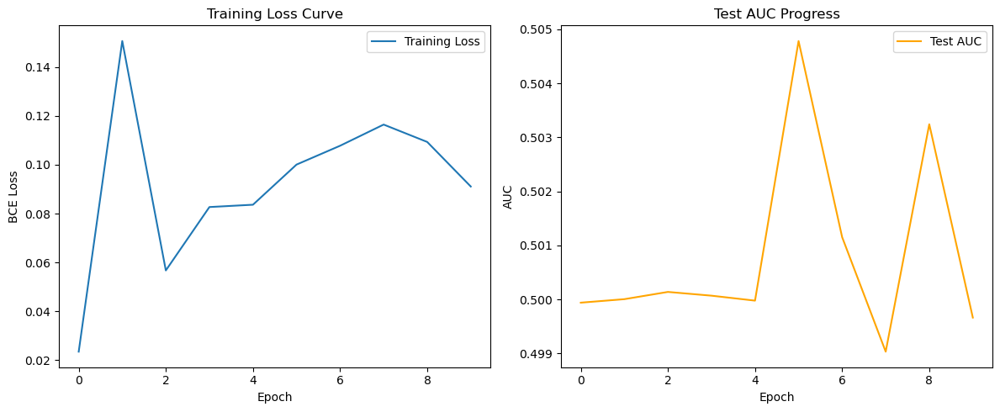

In [32]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

# Lists to store metrics
train_losses = []
test_aucs = []

# Modified training loop with evaluation
for epoch in range(10):
    epoch_loss = 0
    model.train()
    
    # Training phase
    for inputs, labels in train_loader:
        # Move data to GPU
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * inputs.size(0)
    
    # Calculate average epoch loss
    train_loss = epoch_loss / len(train_loader.dataset)
    train_losses.append(train_loss)
    
    # Evaluation phase
    model.eval()
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        for inputs, labels in test_loader:
            # Move data to GPU
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            all_probs.extend(outputs.squeeze().tolist())
            all_labels.extend(labels.tolist())
    
    # Calculate AUC
    auc = roc_auc_score(all_labels, all_probs)
    test_aucs.append(auc)
    
    print(f'Epoch {epoch+1}: Loss={train_loss:.4f}, Test AUC={auc:.4f}')

# Plotting
plt.figure(figsize=(12, 5))

# Loss curve
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('BCE Loss')
plt.title('Training Loss Curve')
plt.legend()

# AUC curve
plt.subplot(1, 2, 2)
plt.plot(test_aucs, label='Test AUC', color='orange')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.title('Test AUC Progress')
plt.legend()

plt.tight_layout()
plt.show()

This is the training loss and test AUC for n-grams of 1 on the entire dataset. 

#### Repeat this exercise using an n-nucleotide representation of your choosing. Compare and contrast the accuracy, AUC, stability, training time, memory requirements, and inference time of your model (10 points)

n=1 Epoch 1: Loss=0.0227, AUC=0.5067, Acc=0.5000
n=1 Epoch 2: Loss=0.0823, AUC=0.5015, Acc=0.5000
n=1 Epoch 3: Loss=0.0748, AUC=0.4997, Acc=0.5000
n=1 Epoch 4: Loss=0.0850, AUC=0.5002, Acc=0.5000
n=1 Epoch 5: Loss=0.1150, AUC=0.4998, Acc=0.5000
n=1 Epoch 6: Loss=0.1162, AUC=0.5002, Acc=0.5000
n=1 Epoch 7: Loss=0.1192, AUC=0.5006, Acc=0.5000
n=1 Epoch 8: Loss=0.1047, AUC=0.5047, Acc=0.5000
n=1 Epoch 9: Loss=0.0848, AUC=0.5036, Acc=0.5000
n=1 Epoch 10: Loss=0.1104, AUC=0.5000, Acc=0.5000


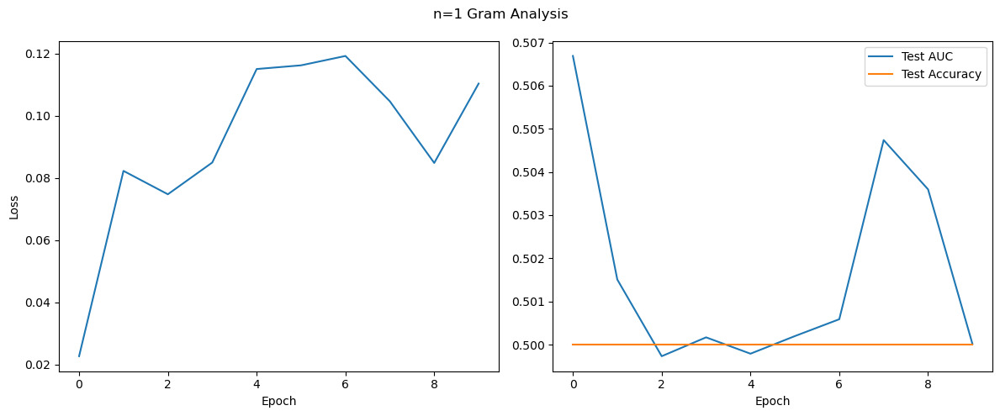

n=2 Epoch 1: Loss=0.0278, AUC=0.5002, Acc=0.5000
n=2 Epoch 2: Loss=0.1394, AUC=0.5006, Acc=0.5000
n=2 Epoch 3: Loss=0.0996, AUC=0.5029, Acc=0.5000
n=2 Epoch 4: Loss=0.0874, AUC=0.5008, Acc=0.5000
n=2 Epoch 5: Loss=0.1007, AUC=0.5022, Acc=0.5000
n=2 Epoch 6: Loss=0.1064, AUC=0.5037, Acc=0.5000
n=2 Epoch 7: Loss=0.1527, AUC=0.5035, Acc=0.5000
n=2 Epoch 8: Loss=0.1216, AUC=0.5026, Acc=0.5000
n=2 Epoch 9: Loss=0.1248, AUC=0.5026, Acc=0.5000
n=2 Epoch 10: Loss=0.0932, AUC=0.5023, Acc=0.5000


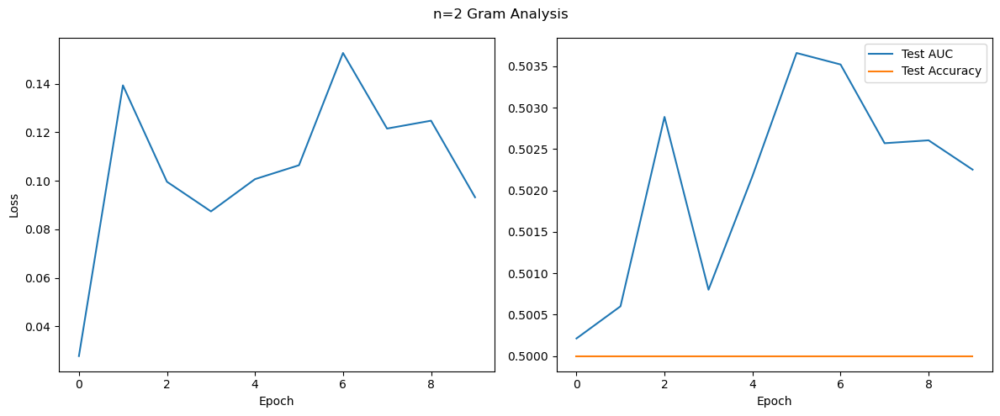

n=3 Epoch 1: Loss=0.0278, AUC=0.4985, Acc=0.5000
n=3 Epoch 2: Loss=0.1088, AUC=0.5011, Acc=0.5000
n=3 Epoch 3: Loss=0.0932, AUC=0.4998, Acc=0.5000
n=3 Epoch 4: Loss=0.0853, AUC=0.4995, Acc=0.5000
n=3 Epoch 5: Loss=0.1019, AUC=0.5002, Acc=0.5000
n=3 Epoch 6: Loss=0.1096, AUC=0.4993, Acc=0.5000
n=3 Epoch 7: Loss=0.0915, AUC=0.5013, Acc=0.5000
n=3 Epoch 8: Loss=0.0912, AUC=0.5014, Acc=0.5000
n=3 Epoch 9: Loss=0.0915, AUC=0.5003, Acc=0.5000
n=3 Epoch 10: Loss=0.0798, AUC=0.5003, Acc=0.5000


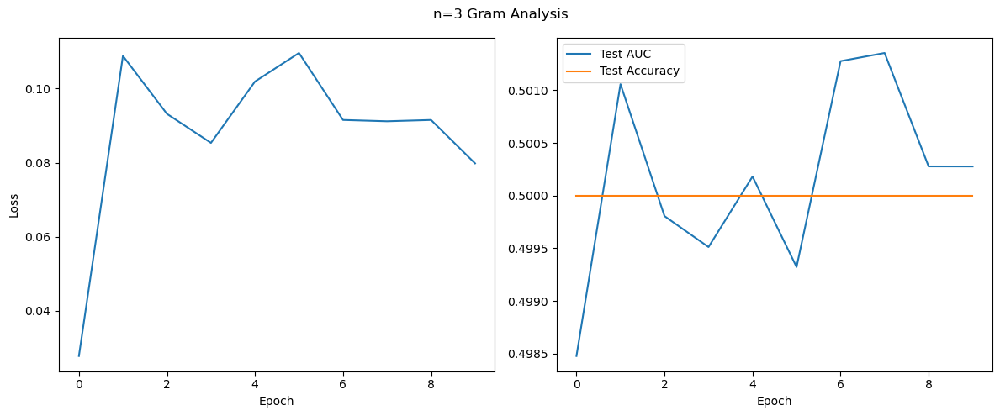


Final Comparison:
n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time
1 | 0.502 | 0.500 | 0.0008 | 13.8s | 184.1MB | 0.0021s
2 | 0.502 | 0.500 | 0.0011 | 11.9s | 105.7MB | 0.0017s
3 | 0.500 | 0.500 | 0.0005 | 11.8s | 79.7MB | 0.0017s


In [35]:
import time
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score
from collections import defaultdict
import numpy as np
from torch.utils.data import DataLoader

def train_and_evaluate(n_gram, train_data, test_data, num_epochs=10):
    # Set device to GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Initialize a fresh model for each n-gram and move it to device
    model = DNA_LSTM(len(train_data.vocab)).to(device)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    # Metrics storage
    metrics = {
        'train_loss': [],
        'test_auc': [],
        'test_acc': [],
        'epoch_times': [],
        'memory_usage': [],
        'inference_times': []
    }
    
    # DataLoaders using 14 cores
    train_loader = DataLoader(train_data, batch_size=32, collate_fn=pad_collate, num_workers=14)
    test_loader = DataLoader(test_data, batch_size=32, collate_fn=pad_collate, num_workers=14)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        epoch_loss = 0
        
        # Training phase
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            
            # Move batch data to GPU
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Reset memory stats if on GPU
            if torch.cuda.is_available():
                torch.cuda.reset_peak_memory_stats()
            
            start_time = time.time()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item() * inputs.size(0)
            
            # Track memory and inference time per batch
            if torch.cuda.is_available():
                metrics['memory_usage'].append(torch.cuda.max_memory_allocated())
            metrics['inference_times'].append(time.time() - start_time)
        
        # Epoch metrics
        metrics['train_loss'].append(epoch_loss / len(train_data))
        metrics['epoch_times'].append(time.time() - epoch_start)
        
        # Evaluation phase
        model.eval()
        all_labels, all_probs = [], []
        
        with torch.no_grad():
            for inputs, labels in test_loader:
                # Move evaluation batch to GPU
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                start_inf = time.time()
                outputs = model(inputs)
                metrics['inference_times'].append(time.time() - start_inf)
                
                # Convert outputs and labels to CPU for metric calculations
                all_probs.extend(outputs.squeeze().cpu().tolist())
                all_labels.extend(labels.cpu().tolist())
        
        # Convert probabilities to binary predictions
        preds = [1 if p > 0.5 else 0 for p in all_probs]
        
        metrics['test_auc'].append(roc_auc_score(all_labels, all_probs))
        metrics['test_acc'].append(accuracy_score(all_labels, preds))
        
        print(f'n={n_gram} Epoch {epoch+1}: '
              f"Loss={metrics['train_loss'][-1]:.4f}, "
              f"AUC={metrics['test_auc'][-1]:.4f}, "
              f"Acc={metrics['test_acc'][-1]:.4f}")
    
    # Calculate stability (loss variance)
    metrics['stability'] = np.var(metrics['train_loss'])
    
    # Calculate averages
    metrics['avg_train_time'] = np.mean(metrics['epoch_times'])
    metrics['avg_memory'] = np.mean(metrics['memory_usage']) if metrics['memory_usage'] else 0
    metrics['avg_inference'] = np.mean(metrics['inference_times'])
    
    return metrics

def compare_ngrams(ngrams=[1, 2, 3]):
    results = {}
    
    for n in ngrams:
        # Create datasets using local variables train_ds and test_ds
        train_data = NGramDataset(train_ds, n=n)
        test_data = NGramDataset(test_ds, n=n, vocab=train_data.vocab)
        
        # Train and evaluate
        results[n] = train_and_evaluate(n, train_data, test_data)
        
        # Plotting the results for current n-gram
        plt.figure(figsize=(12, 5))
        plt.suptitle(f'n={n} Gram Analysis')
        
        plt.subplot(1, 2, 1)
        plt.plot(results[n]['train_loss'], label='Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        
        plt.subplot(1, 2, 2)
        plt.plot(results[n]['test_auc'], label='Test AUC')
        plt.plot(results[n]['test_acc'], label='Test Accuracy')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    
    # Print comparison table
    print("\nFinal Comparison:")
    print("n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time")
    for n in ngrams:
        print(f"{n} | {np.mean(results[n]['test_auc']):.3f} | "
              f"{np.mean(results[n]['test_acc']):.3f} | "
              f"{results[n]['stability']:.4f} | "
              f"{results[n]['avg_train_time']:.1f}s | "
              f"{results[n]['avg_memory']/1e6:.1f}MB | "
              f"{results[n]['avg_inference']:.4f}s")

# Run comparison
compare_ngrams()

### Training a Transformer (40 points)

As you all know, the Transformer architecture has taken the world of Natural Language Processing by storm and the world of biology followed soon after. The transformer is the backbone upon which most of the necessary architectures are built nowadays.

In this part of the assignment, you are asked to build an initial transformer and iterate on it, through linearization of attention to reduce requirements and runtime, incredible engineering feats such as flash-attention as well as read through and implement some of the more academic versions through outside resources such as x-transformers and huggingface's libraries.

#### Train a vanilla transformer on a subset of the data (10 points)

You can use 1/10th, or 1/5th of the data depending on runtimes.

Evaluate the results on the test set.

Never forget your positional encodings!

In [37]:
class DNA_Transformer(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, num_heads=4):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, embed_dim)
        self.pos_encoder = nn.Parameter(torch.randn(1, 1000, embed_dim))  # Max length 1000
        
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            dim_feedforward=512,
            dropout=0.1,
            batch_first=True  
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=3)
        self.classifier = nn.Linear(embed_dim, 1)
    
    def forward(self, x):
        # x shape: (batch, seq_len)
        x = self.embed(x) + self.pos_encoder[:, :x.size(1), :]
        x = self.transformer(x)  # Now uses batch_first: (batch, seq_len, embed_dim)
        return torch.sigmoid(self.classifier(x.mean(dim=1)))

n=1 Epoch 1: Loss=0.6669, AUC=0.6737, Acc=0.6114
n=1 Epoch 2: Loss=0.6470, AUC=0.6886, Acc=0.6342
n=1 Epoch 3: Loss=0.6230, AUC=0.7452, Acc=0.6716
n=1 Epoch 4: Loss=0.6050, AUC=0.7068, Acc=0.5689
n=1 Epoch 5: Loss=0.6028, AUC=0.7438, Acc=0.6747
n=1 Epoch 6: Loss=0.5908, AUC=0.7524, Acc=0.6778
n=1 Epoch 7: Loss=0.5855, AUC=0.7531, Acc=0.6791
n=1 Epoch 8: Loss=0.5840, AUC=0.7553, Acc=0.6818
n=1 Epoch 9: Loss=0.5803, AUC=0.7561, Acc=0.6815
n=1 Epoch 10: Loss=0.5944, AUC=0.7521, Acc=0.6844


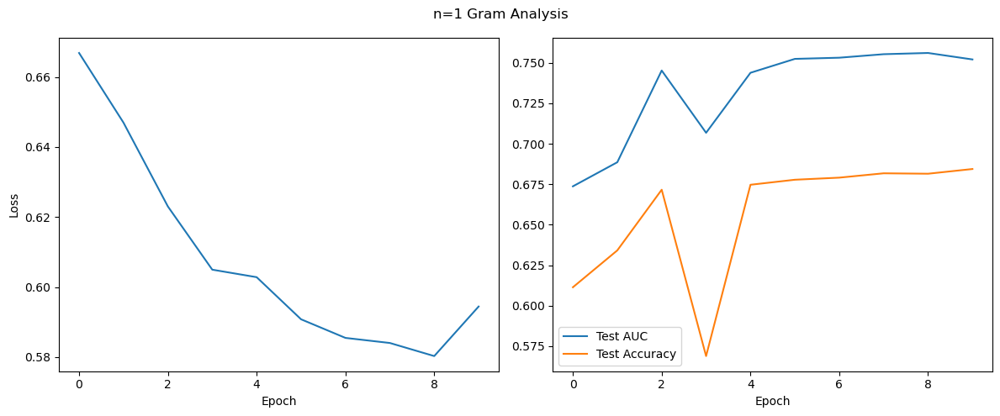

n=2 Epoch 1: Loss=0.6210, AUC=0.7666, Acc=0.6863
n=2 Epoch 2: Loss=0.5734, AUC=0.7745, Acc=0.6994
n=2 Epoch 3: Loss=0.5602, AUC=0.7767, Acc=0.7010
n=2 Epoch 4: Loss=0.5466, AUC=0.7882, Acc=0.7138
n=2 Epoch 5: Loss=0.5407, AUC=0.7879, Acc=0.7056
n=2 Epoch 6: Loss=0.5360, AUC=0.7919, Acc=0.7128
n=2 Epoch 7: Loss=0.5313, AUC=0.7946, Acc=0.7157
n=2 Epoch 8: Loss=0.5337, AUC=0.7845, Acc=0.7000
n=2 Epoch 9: Loss=0.5360, AUC=0.7900, Acc=0.7128
n=2 Epoch 10: Loss=0.5337, AUC=0.7854, Acc=0.7057


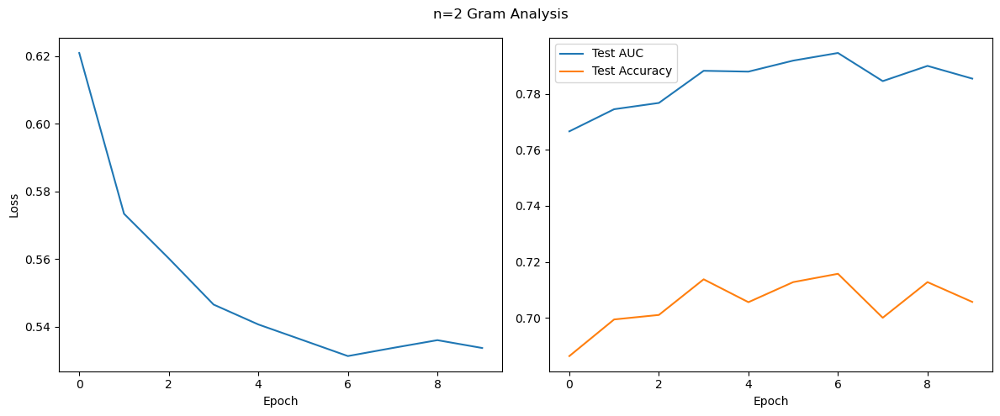

n=3 Epoch 1: Loss=0.6254, AUC=0.7793, Acc=0.7054
n=3 Epoch 2: Loss=0.5514, AUC=0.7844, Acc=0.7136
n=3 Epoch 3: Loss=0.5353, AUC=0.7871, Acc=0.7118
n=3 Epoch 4: Loss=0.5263, AUC=0.7914, Acc=0.7159
n=3 Epoch 5: Loss=0.5169, AUC=0.7874, Acc=0.7104
n=3 Epoch 6: Loss=0.5142, AUC=0.7918, Acc=0.7172
n=3 Epoch 7: Loss=0.5091, AUC=0.7856, Acc=0.7127
n=3 Epoch 8: Loss=0.5050, AUC=0.7867, Acc=0.7145
n=3 Epoch 9: Loss=0.5065, AUC=0.7868, Acc=0.7127
n=3 Epoch 10: Loss=0.5080, AUC=0.7922, Acc=0.7151


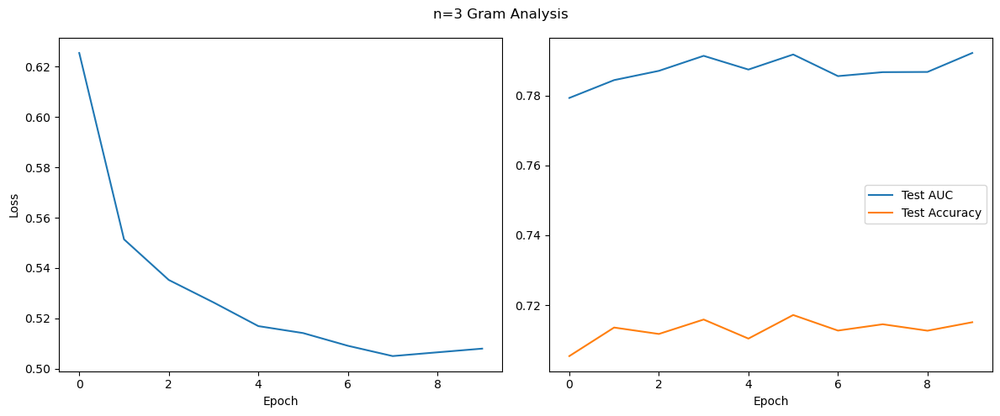


Final Comparison:
n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time
1 | 0.733 | 0.657 | 0.0008 | 11.6s | 567.2MB | 0.0084s
2 | 0.784 | 0.705 | 0.0007 | 5.8s | 303.4MB | 0.0042s
3 | 0.787 | 0.713 | 0.0012 | 4.5s | 215.2MB | 0.0032s


In [40]:
import time
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score
from collections import defaultdict
import numpy as np
from torch.utils.data import DataLoader

train_ds_subset = create_balanced_subset(train_ds, 12388)

def train_and_evaluate(n_gram, train_data, test_data, num_epochs=10):
    # Set device: GPU if available, otherwise CPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Initialize fresh model for each n-gram and move to device
    model = DNA_Transformer(len(train_data.vocab)).to(device)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    # Metrics storage
    metrics = {
        'train_loss': [],
        'test_auc': [],
        'test_acc': [],
        'epoch_times': [],
        'memory_usage': [],
        'inference_times': []
    }
    
    # DataLoaders
    train_loader = DataLoader(train_data, batch_size=32, collate_fn=pad_collate, num_workers= 14)
    test_loader = DataLoader(test_data, batch_size=32, collate_fn=pad_collate, num_workers= 14)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        epoch_loss = 0
        
        # Training phase
        for inputs, labels in train_loader:
            # Move data to GPU
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            optimizer.zero_grad()
            
            # Track memory if on GPU
            if torch.cuda.is_available():
                torch.cuda.reset_peak_memory_stats()
            
            start_time = time.time()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item() * inputs.size(0)
            
            # Track memory and time
            if torch.cuda.is_available():
                metrics['memory_usage'].append(torch.cuda.max_memory_allocated())
            metrics['inference_times'].append(time.time() - start_time)
        
        # Epoch metrics
        metrics['train_loss'].append(epoch_loss / len(train_data))
        metrics['epoch_times'].append(time.time() - epoch_start)
        
        # Evaluation phase
        model.eval()
        all_labels, all_probs = [], []
        
        with torch.no_grad():
            for inputs, labels in test_loader:
                # Move data to GPU
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                start_inf = time.time()
                outputs = model(inputs)
                metrics['inference_times'].append(time.time() - start_inf)
                
                # Convert outputs and labels back to CPU for metric calculations
                all_probs.extend(outputs.squeeze().cpu().tolist())
                all_labels.extend(labels.cpu().tolist())
        
        # Convert probabilities to predictions
        preds = [1 if p > 0.5 else 0 for p in all_probs]
        
        metrics['test_auc'].append(roc_auc_score(all_labels, all_probs))
        metrics['test_acc'].append(accuracy_score(all_labels, preds))
        
        print(f'n={n_gram} Epoch {epoch+1}: '
              f"Loss={metrics['train_loss'][-1]:.4f}, "
              f"AUC={metrics['test_auc'][-1]:.4f}, "
              f"Acc={metrics['test_acc'][-1]:.4f}")
    
    # Calculate stability (loss variance)
    metrics['stability'] = np.var(metrics['train_loss'])
    
    # Calculate averages
    metrics['avg_train_time'] = np.mean(metrics['epoch_times'])
    metrics['avg_memory'] = np.mean(metrics['memory_usage']) if metrics['memory_usage'] else 0
    metrics['avg_inference'] = np.mean(metrics['inference_times'])
    
    return metrics

def compare_ngrams(ngrams=[1, 2, 3]):
    results = {}
    
    for n in ngrams:
        # Create datasets
        train_data = NGramDataset(train_ds_subset, n=n)
        test_data = NGramDataset(test_ds, n=n, vocab=train_data.vocab)
        
        # Train and evaluate
        results[n] = train_and_evaluate(n, train_data, test_data)
        
        # Plotting
        plt.figure(figsize=(12, 5))
        plt.suptitle(f'n={n} Gram Analysis')
        
        plt.subplot(1, 2, 1)
        plt.plot(results[n]['train_loss'], label='Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        
        plt.subplot(1, 2, 2)
        plt.plot(results[n]['test_auc'], label='Test AUC')
        plt.plot(results[n]['test_acc'], label='Test Accuracy')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    
    # Print comparison table
    print("\nFinal Comparison:")
    print("n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time")
    for n in ngrams:
        print(f"{n} | {np.mean(results[n]['test_auc']):.3f} | "
              f"{np.mean(results[n]['test_acc']):.3f} | "
              f"{results[n]['stability']:.4f} | "
              f"{results[n]['avg_train_time']:.1f}s | "
              f"{results[n]['avg_memory']/1e6:.1f}MB | "
              f"{results[n]['avg_inference']:.4f}s")

# Run comparison
compare_ngrams()

#### Train a linearized transformer (your choice) on a subset of the data (10 points)

Use a linearized transformer and re-train. Juxtapose differences in memory and runtime requirements requirements, accuracy, AUC.

In [45]:
# Requires: pip install performer-pytorch
from performer_pytorch import Performer

class LinearTransformer(nn.Module):
    def __init__(self, vocab_size):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, 128)
        self.model = Performer(
            dim=128,
            depth=3,
            heads=4,
            dim_head=32,   # required argument: each head gets 32 dimensions (128 // 4)
            causal=False
        )
        self.classifier = nn.Linear(128, 1)
    
    def forward(self, x):
        x = self.embed(x)
        x = self.model(x)
        return torch.sigmoid(self.classifier(x.mean(dim=1)))

n=1 Epoch 1: Loss=0.6691, AUC=0.6715, Acc=0.6284
n=1 Epoch 2: Loss=0.6565, AUC=0.6709, Acc=0.6079
n=1 Epoch 3: Loss=0.6541, AUC=0.6688, Acc=0.6023
n=1 Epoch 4: Loss=0.6525, AUC=0.6714, Acc=0.5974
n=1 Epoch 5: Loss=0.6515, AUC=0.6720, Acc=0.5971
n=1 Epoch 6: Loss=0.6508, AUC=0.6734, Acc=0.6011
n=1 Epoch 7: Loss=0.6504, AUC=0.6731, Acc=0.6035
n=1 Epoch 8: Loss=0.6495, AUC=0.6722, Acc=0.6002
n=1 Epoch 9: Loss=0.6490, AUC=0.6662, Acc=0.5985
n=1 Epoch 10: Loss=0.6494, AUC=0.6728, Acc=0.6068


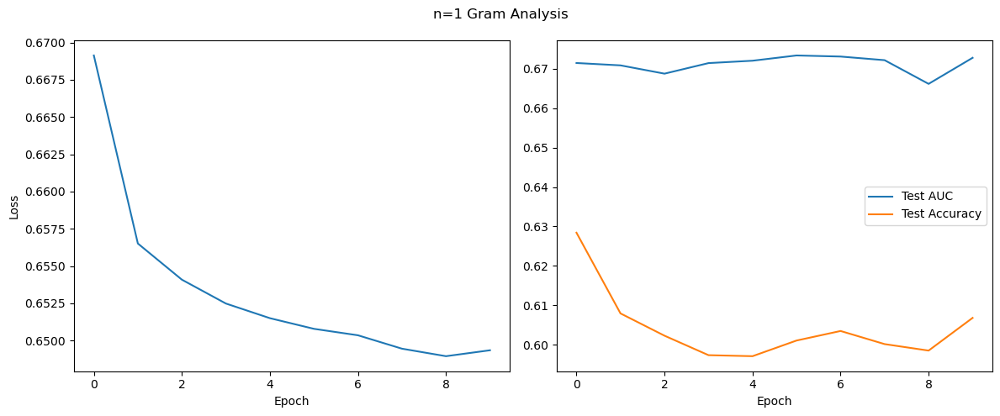

n=2 Epoch 1: Loss=0.6660, AUC=0.6828, Acc=0.6348
n=2 Epoch 2: Loss=0.6488, AUC=0.6838, Acc=0.5977
n=2 Epoch 3: Loss=0.6436, AUC=0.6837, Acc=0.6071
n=2 Epoch 4: Loss=0.6407, AUC=0.6833, Acc=0.6186
n=2 Epoch 5: Loss=0.6405, AUC=0.6841, Acc=0.6252
n=2 Epoch 6: Loss=0.6398, AUC=0.6871, Acc=0.6268
n=2 Epoch 7: Loss=0.6381, AUC=0.6849, Acc=0.6298
n=2 Epoch 8: Loss=0.6375, AUC=0.6862, Acc=0.6299
n=2 Epoch 9: Loss=0.6360, AUC=0.6874, Acc=0.6266
n=2 Epoch 10: Loss=0.6404, AUC=0.6850, Acc=0.6203


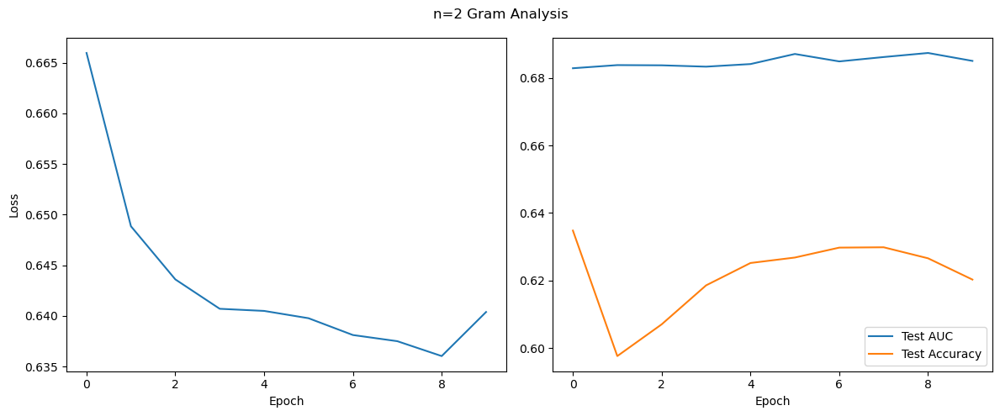

n=3 Epoch 1: Loss=0.6585, AUC=0.6771, Acc=0.6233
n=3 Epoch 2: Loss=0.6401, AUC=0.6952, Acc=0.6344
n=3 Epoch 3: Loss=0.6342, AUC=0.7011, Acc=0.6311
n=3 Epoch 4: Loss=0.6287, AUC=0.7030, Acc=0.6306
n=3 Epoch 5: Loss=0.6297, AUC=0.7058, Acc=0.6483
n=3 Epoch 6: Loss=0.6275, AUC=0.7095, Acc=0.6469
n=3 Epoch 7: Loss=0.6246, AUC=0.7100, Acc=0.6477
n=3 Epoch 8: Loss=0.6246, AUC=0.7090, Acc=0.6368
n=3 Epoch 9: Loss=0.6239, AUC=0.7070, Acc=0.6397
n=3 Epoch 10: Loss=0.6208, AUC=0.7089, Acc=0.6441


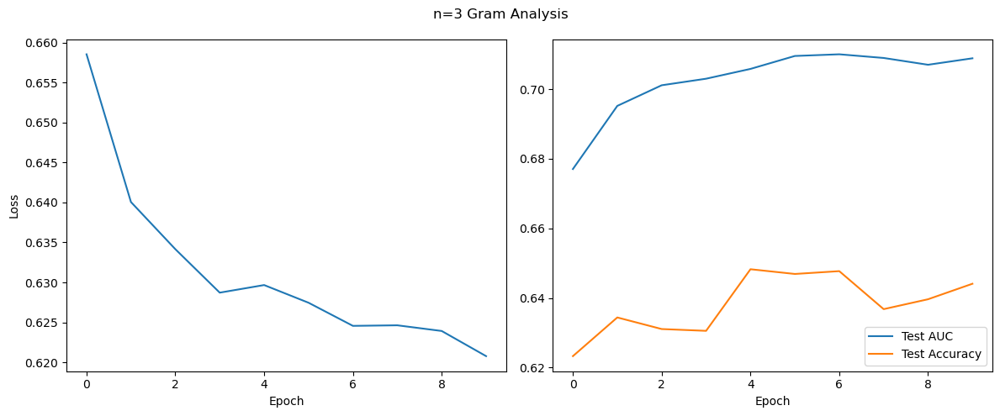


Final Comparison:
n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time
1 | 0.671 | 0.604 | 0.0000 | 7.1s | 869.1MB | 0.0081s
2 | 0.685 | 0.622 | 0.0001 | 4.6s | 451.2MB | 0.0060s
3 | 0.703 | 0.638 | 0.0001 | 5.1s | 312.3MB | 0.0058s


In [48]:
import time
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score
from collections import defaultdict
import numpy as np
from torch.utils.data import DataLoader

train_ds_subset = create_balanced_subset(train_ds, 8259)

def train_and_evaluate(n_gram, train_data, test_data, num_epochs=10):
    # Set device to GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Initialize a fresh model for each n-gram and move to device
    model = LinearTransformer(vocab_size=len(train_data.vocab)).to(device)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    # Metrics storage
    metrics = {
        'train_loss': [],
        'test_auc': [],
        'test_acc': [],
        'epoch_times': [],
        'memory_usage': [],
        'inference_times': []
    }
    
    # DataLoaders with 14 cores
    train_loader = DataLoader(train_data, batch_size=32, collate_fn=pad_collate, num_workers=14)
    test_loader = DataLoader(test_data, batch_size=32, collate_fn=pad_collate, num_workers=14)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        epoch_loss = 0
        
        # Training phase
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            
            # Move inputs and labels to GPU
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Reset memory stats if using GPU
            if torch.cuda.is_available():
                torch.cuda.reset_peak_memory_stats()
            
            start_time = time.time()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item() * inputs.size(0)
            
            # Track memory and inference time per batch
            if torch.cuda.is_available():
                metrics['memory_usage'].append(torch.cuda.max_memory_allocated())
            metrics['inference_times'].append(time.time() - start_time)
        
        # Epoch metrics
        metrics['train_loss'].append(epoch_loss / len(train_data))
        metrics['epoch_times'].append(time.time() - epoch_start)
        
        # Evaluation phase
        model.eval()
        all_labels, all_probs = [], []
        
        with torch.no_grad():
            for inputs, labels in test_loader:
                # Move evaluation batch to GPU
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                start_inf = time.time()
                outputs = model(inputs)
                metrics['inference_times'].append(time.time() - start_inf)
                
                # Convert outputs and labels to CPU for metric calculations
                all_probs.extend(outputs.squeeze().cpu().tolist())
                all_labels.extend(labels.cpu().tolist())
        
        # Convert probabilities to binary predictions
        preds = [1 if p > 0.5 else 0 for p in all_probs]
        
        metrics['test_auc'].append(roc_auc_score(all_labels, all_probs))
        metrics['test_acc'].append(accuracy_score(all_labels, preds))
        
        print(f'n={n_gram} Epoch {epoch+1}: '
              f"Loss={metrics['train_loss'][-1]:.4f}, "
              f"AUC={metrics['test_auc'][-1]:.4f}, "
              f"Acc={metrics['test_acc'][-1]:.4f}")
    
    # Calculate stability (loss variance)
    metrics['stability'] = np.var(metrics['train_loss'])
    
    # Calculate averages
    metrics['avg_train_time'] = np.mean(metrics['epoch_times'])
    metrics['avg_memory'] = np.mean(metrics['memory_usage']) if metrics['memory_usage'] else 0
    metrics['avg_inference'] = np.mean(metrics['inference_times'])
    
    return metrics

def compare_ngrams(ngrams=[1, 2, 3]):
    results = {}
    
    for n in ngrams:
        # Create datasets using the local train_ds and test_ds
        train_data = NGramDataset(train_ds_subset, n=n)
        test_data = NGramDataset(test_ds, n=n, vocab=train_data.vocab)
        
        # Train and evaluate
        results[n] = train_and_evaluate(n, train_data, test_data)
        
        # Plotting
        plt.figure(figsize=(12, 5))
        plt.suptitle(f'n={n} Gram Analysis')
        
        plt.subplot(1, 2, 1)
        plt.plot(results[n]['train_loss'], label='Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        
        plt.subplot(1, 2, 2)
        plt.plot(results[n]['test_auc'], label='Test AUC')
        plt.plot(results[n]['test_acc'], label='Test Accuracy')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    
    # Print comparison table
    print("\nFinal Comparison:")
    print("n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time")
    for n in ngrams:
        print(f"{n} | {np.mean(results[n]['test_auc']):.3f} | "
              f"{np.mean(results[n]['test_acc']):.3f} | "
              f"{results[n]['stability']:.4f} | "
              f"{results[n]['avg_train_time']:.1f}s | "
              f"{results[n]['avg_memory']/1e6:.1f}MB | "
              f"{results[n]['avg_inference']:.4f}s")

# Run comparison
compare_ngrams()

**Linearized transformer vs vanilla transformer**: Compared to a vanilla transformer, the linearized transformer took less time to train on the 1-ngram dataset. However, it has a higher memory requirement than the vanilla transformer and a lower test set AUC.  

#### Train a transformer that uses Flash Attention (10 points)

In [52]:
# Requires: pip install flash-attn
from flash_attn.modules.mha import FlashCrossAttention
import torch
import torch.nn as nn

class FlashTransformer(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, num_heads=4):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, embed_dim)
        self.attention = FlashCrossAttention()  # Currently not used in forward; integrate as needed.
        self.pos_encoder = nn.Parameter(torch.randn(1, 1000, embed_dim))  # Max length 1000
        
        # Set batch_first=True to avoid the warning and improve performance.
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            dim_feedforward=512,
            dropout=0.1,
            batch_first=True  # This ensures input/output shape: (batch, seq, embed_dim)
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=3)
        self.classifier = nn.Linear(embed_dim, 1)
    
    def forward(self, x):
        # x is expected to have shape (batch, seq_length)
        x = self.embed(x) + self.pos_encoder[:, :x.size(1), :]
        x = self.transformer(x)
        return torch.sigmoid(self.classifier(x.mean(dim=1)))

n=1 Epoch 1: Loss=0.6763, AUC=0.6612, Acc=0.5926
n=1 Epoch 2: Loss=0.6308, AUC=0.7281, Acc=0.6546
n=1 Epoch 3: Loss=0.6541, AUC=0.7269, Acc=0.6571
n=1 Epoch 4: Loss=0.6029, AUC=0.7448, Acc=0.6808
n=1 Epoch 5: Loss=0.5924, AUC=0.7524, Acc=0.6776
n=1 Epoch 6: Loss=0.6005, AUC=0.6800, Acc=0.6308
n=1 Epoch 7: Loss=0.6152, AUC=0.7388, Acc=0.6463
n=1 Epoch 8: Loss=0.6097, AUC=0.6911, Acc=0.6455
n=1 Epoch 9: Loss=0.6188, AUC=0.7112, Acc=0.6522
n=1 Epoch 10: Loss=0.6107, AUC=0.7153, Acc=0.6492


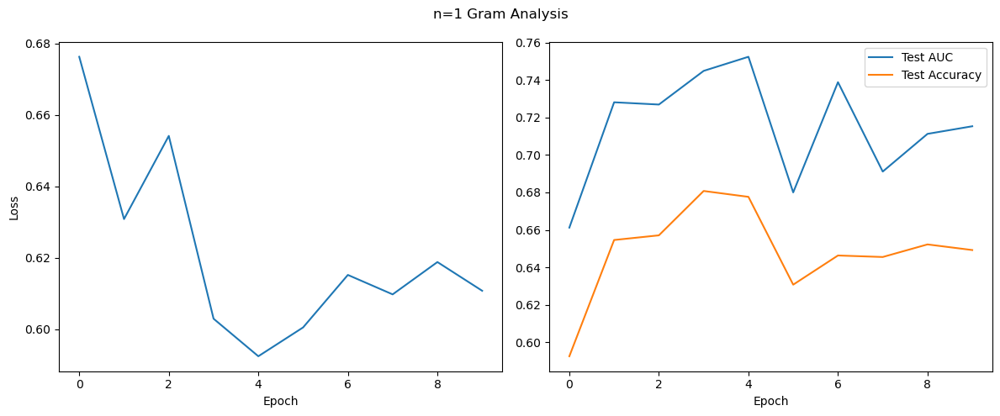

n=2 Epoch 1: Loss=0.6517, AUC=0.7581, Acc=0.6858
n=2 Epoch 2: Loss=0.5833, AUC=0.7622, Acc=0.6802
n=2 Epoch 3: Loss=0.5616, AUC=0.7728, Acc=0.6815
n=2 Epoch 4: Loss=0.5472, AUC=0.7720, Acc=0.6843
n=2 Epoch 5: Loss=0.5374, AUC=0.7803, Acc=0.7018
n=2 Epoch 6: Loss=0.5258, AUC=0.7807, Acc=0.7074
n=2 Epoch 7: Loss=0.5166, AUC=0.7837, Acc=0.7079
n=2 Epoch 8: Loss=0.5103, AUC=0.7800, Acc=0.6999
n=2 Epoch 9: Loss=0.5080, AUC=0.7788, Acc=0.7027
n=2 Epoch 10: Loss=0.5123, AUC=0.7763, Acc=0.7066


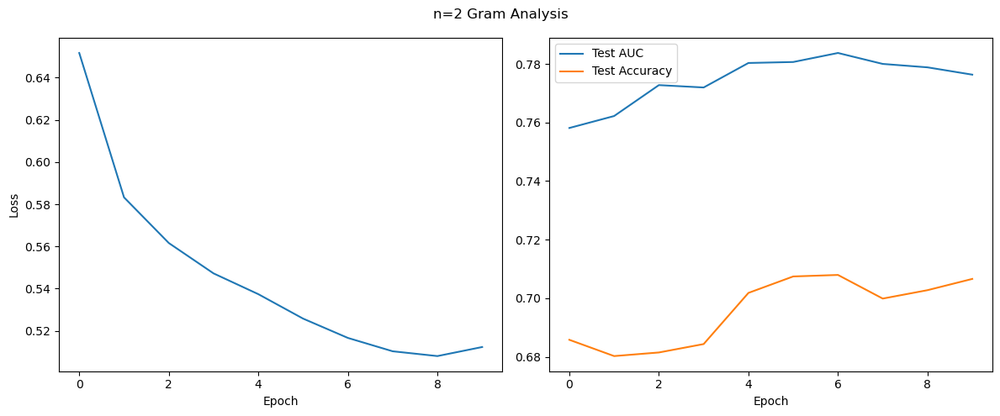

n=3 Epoch 1: Loss=0.6571, AUC=0.7487, Acc=0.6828
n=3 Epoch 2: Loss=0.5649, AUC=0.7907, Acc=0.7090
n=3 Epoch 3: Loss=0.5382, AUC=0.7914, Acc=0.7105
n=3 Epoch 4: Loss=0.5195, AUC=0.7908, Acc=0.7092
n=3 Epoch 5: Loss=0.5076, AUC=0.7922, Acc=0.7154
n=3 Epoch 6: Loss=0.4982, AUC=0.7941, Acc=0.7114
n=3 Epoch 7: Loss=0.4872, AUC=0.7915, Acc=0.7160
n=3 Epoch 8: Loss=0.4784, AUC=0.7892, Acc=0.7149
n=3 Epoch 9: Loss=0.4718, AUC=0.7879, Acc=0.7083
n=3 Epoch 10: Loss=0.4651, AUC=0.7845, Acc=0.7097


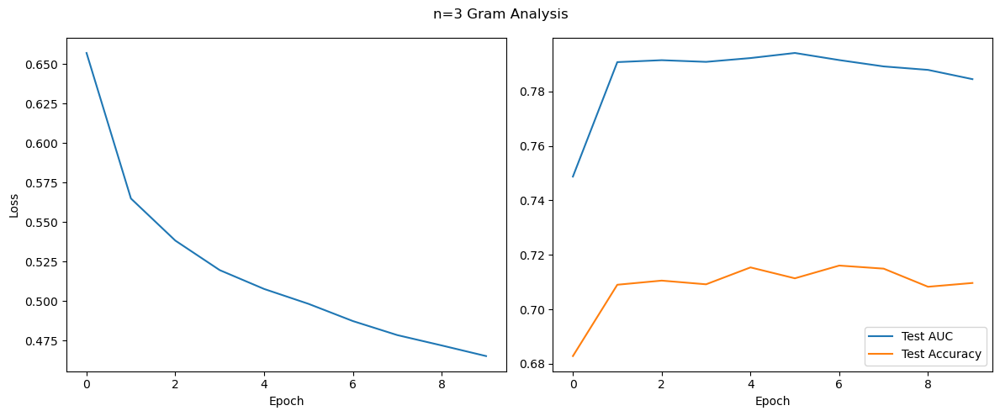


Final Comparison:
n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time
1 | 0.715 | 0.649 | 0.0006 | 8.0s | 565.3MB | 0.0065s
2 | 0.774 | 0.696 | 0.0018 | 4.1s | 302.9MB | 0.0033s
3 | 0.786 | 0.709 | 0.0030 | 3.2s | 214.5MB | 0.0025s


In [53]:
import time
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score
from collections import defaultdict
import numpy as np
from torch.utils.data import DataLoader

train_ds_subset = create_balanced_subset(train_ds, 8259)

def train_and_evaluate(n_gram, train_data, test_data, num_epochs=10):
    # Set device to GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Initialize a fresh model for each n-gram and move to device
    model = FlashTransformer(vocab_size=len(train_data.vocab)).to(device)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    # Metrics storage
    metrics = {
        'train_loss': [],
        'test_auc': [],
        'test_acc': [],
        'epoch_times': [],
        'memory_usage': [],
        'inference_times': []
    }
    
    # DataLoaders with 14 cores
    train_loader = DataLoader(train_data, batch_size=32, collate_fn=pad_collate, num_workers=14)
    test_loader = DataLoader(test_data, batch_size=32, collate_fn=pad_collate, num_workers=14)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        epoch_loss = 0
        
        # Training phase
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            
            # Move inputs and labels to GPU
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Reset memory stats if using GPU
            if torch.cuda.is_available():
                torch.cuda.reset_peak_memory_stats()
            
            start_time = time.time()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item() * inputs.size(0)
            
            # Track memory and inference time per batch
            if torch.cuda.is_available():
                metrics['memory_usage'].append(torch.cuda.max_memory_allocated())
            metrics['inference_times'].append(time.time() - start_time)
        
        # Epoch metrics
        metrics['train_loss'].append(epoch_loss / len(train_data))
        metrics['epoch_times'].append(time.time() - epoch_start)
        
        # Evaluation phase
        model.eval()
        all_labels, all_probs = [], []
        
        with torch.no_grad():
            for inputs, labels in test_loader:
                # Move evaluation batch to GPU
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                start_inf = time.time()
                outputs = model(inputs)
                metrics['inference_times'].append(time.time() - start_inf)
                
                # Convert outputs and labels to CPU for metric calculations
                all_probs.extend(outputs.squeeze().cpu().tolist())
                all_labels.extend(labels.cpu().tolist())
        
        # Convert probabilities to binary predictions
        preds = [1 if p > 0.5 else 0 for p in all_probs]
        
        metrics['test_auc'].append(roc_auc_score(all_labels, all_probs))
        metrics['test_acc'].append(accuracy_score(all_labels, preds))
        
        print(f'n={n_gram} Epoch {epoch+1}: '
              f"Loss={metrics['train_loss'][-1]:.4f}, "
              f"AUC={metrics['test_auc'][-1]:.4f}, "
              f"Acc={metrics['test_acc'][-1]:.4f}")
    
    # Calculate stability (loss variance)
    metrics['stability'] = np.var(metrics['train_loss'])
    
    # Calculate averages
    metrics['avg_train_time'] = np.mean(metrics['epoch_times'])
    metrics['avg_memory'] = np.mean(metrics['memory_usage']) if metrics['memory_usage'] else 0
    metrics['avg_inference'] = np.mean(metrics['inference_times'])
    
    return metrics

def compare_ngrams(ngrams=[1, 2, 3]):
    results = {}
    
    for n in ngrams:
        # Create datasets using the local train_ds and test_ds
        train_data = NGramDataset(train_ds_subset, n=n)
        test_data = NGramDataset(test_ds, n=n, vocab=train_data.vocab)
        
        # Train and evaluate
        results[n] = train_and_evaluate(n, train_data, test_data)
        
        # Plotting
        plt.figure(figsize=(12, 5))
        plt.suptitle(f'n={n} Gram Analysis')
        
        plt.subplot(1, 2, 1)
        plt.plot(results[n]['train_loss'], label='Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        
        plt.subplot(1, 2, 2)
        plt.plot(results[n]['test_auc'], label='Test AUC')
        plt.plot(results[n]['test_acc'], label='Test Accuracy')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    
    # Print comparison table
    print("\nFinal Comparison:")
    print("n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time")
    for n in ngrams:
        print(f"{n} | {np.mean(results[n]['test_auc']):.3f} | "
              f"{np.mean(results[n]['test_acc']):.3f} | "
              f"{results[n]['stability']:.4f} | "
              f"{results[n]['avg_train_time']:.1f}s | "
              f"{results[n]['avg_memory']/1e6:.1f}MB | "
              f"{results[n]['avg_inference']:.4f}s")

# Run comparison
compare_ngrams()

**Flash attention vs linearized transformer**: Compared to the linearized transformer, the transformer with flash attention took slightly less time to train, and seems to have lower memory requirements. Additionally, it seems to have have a better test AUC. 

#### Train a model that uses recent architectural improvements in transformers (10 points)

A great reference is here: https://github.com/lucidrains/x-transformers. You're free to use any combination of architecture and optimizer you would like to test. E.g. layers of BatchNorm, multiple transformer layers, MLA implementations, second-order optimizers, torch JIT compilation, etc. 

Please write a small paragraph about why you chose that specific architectural development. You are not required to use xtransformers, but please point me to the library you utilized and steps to install it.

Once again, compare and constrast for runtime, memory, accuracy, AUC.


In [109]:
# Requires: pip install flash-attn
from flash_attn.modules.mha import FlashCrossAttention
import torch
import torch.nn as nn

class BNFlashTransformer(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, num_heads=4):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, embed_dim)
        self.attention = FlashCrossAttention()  # Currently not used in forward; integrate as needed.
        self.pos_encoder = nn.Parameter(torch.randn(1, 1000, embed_dim))  # Max length 1000
        
        # Set batch_first=True to avoid the warning and improve performance.
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            dim_feedforward=512,
            dropout=0.1,
            batch_first=True  # This ensures input/output shape: (batch, seq, embed_dim)
        )

        # BatchNorm layers
        self.embed_bn = nn.BatchNorm1d(embed_dim)
        
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=3)
        self.classifier = nn.Linear(embed_dim, 1)
    
    def forward(self, x):
        # x is expected to have shape (batch, seq_length)
        x = self.embed(x) 
        
        # Apply BatchNorm to embeddings
        x = x.permute(0, 2, 1)
        x = self.embed_bn(x)
        x = x.permute(0, 2, 1)

        x = x + self.pos_encoder[:, :x.size(1), :]

        x = self.transformer(x)
        return torch.sigmoid(self.classifier(x.mean(dim=1)))

n=1 Epoch 1: Loss=0.6705, AUC=0.6661, Acc=0.6194
n=1 Epoch 2: Loss=0.6576, AUC=0.7260, Acc=0.6588
n=1 Epoch 3: Loss=0.6052, AUC=0.7360, Acc=0.6629
n=1 Epoch 4: Loss=0.6004, AUC=0.7384, Acc=0.6748
n=1 Epoch 5: Loss=0.5968, AUC=0.6936, Acc=0.6210
n=1 Epoch 6: Loss=0.6708, AUC=0.6357, Acc=0.5994
n=1 Epoch 7: Loss=0.6573, AUC=0.6064, Acc=0.5816
n=1 Epoch 8: Loss=0.6453, AUC=0.6543, Acc=0.6152
n=1 Epoch 9: Loss=0.6371, AUC=0.6299, Acc=0.6044
n=1 Epoch 10: Loss=0.6651, AUC=0.4713, Acc=0.5002


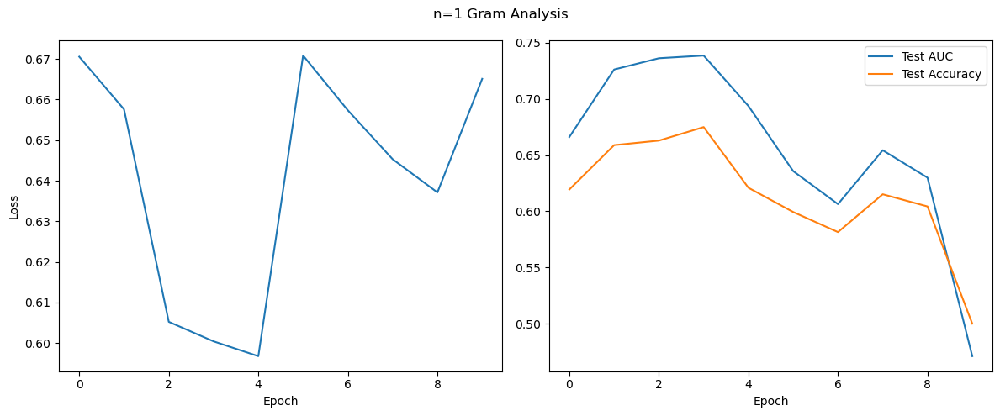

n=2 Epoch 1: Loss=0.6530, AUC=0.7686, Acc=0.6910
n=2 Epoch 2: Loss=0.5757, AUC=0.7886, Acc=0.7084
n=2 Epoch 3: Loss=0.5588, AUC=0.7829, Acc=0.7046
n=2 Epoch 4: Loss=0.5521, AUC=0.7900, Acc=0.7123
n=2 Epoch 5: Loss=0.5371, AUC=0.7832, Acc=0.7078
n=2 Epoch 6: Loss=0.5468, AUC=0.7853, Acc=0.7092
n=2 Epoch 7: Loss=0.5321, AUC=0.7896, Acc=0.7145
n=2 Epoch 8: Loss=0.5191, AUC=0.7893, Acc=0.7146
n=2 Epoch 9: Loss=0.5125, AUC=0.7907, Acc=0.7161
n=2 Epoch 10: Loss=0.5090, AUC=0.7841, Acc=0.7068


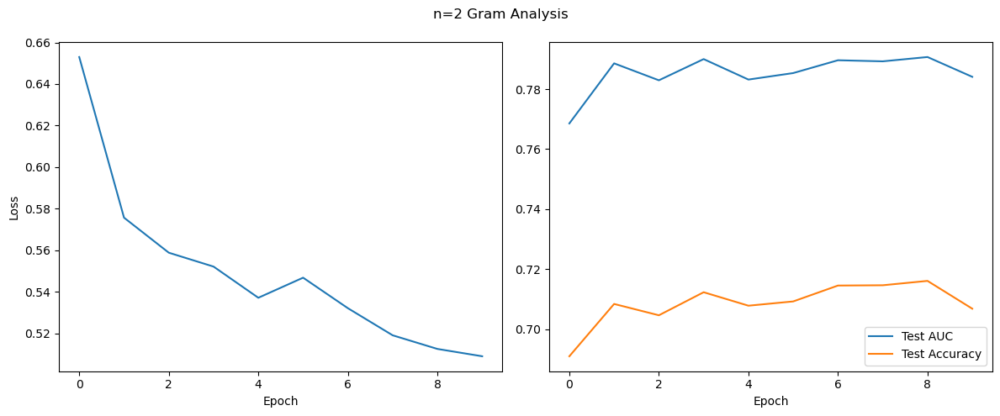

n=3 Epoch 1: Loss=0.6456, AUC=0.7695, Acc=0.6995
n=3 Epoch 2: Loss=0.5717, AUC=0.7884, Acc=0.7143
n=3 Epoch 3: Loss=0.5489, AUC=0.7948, Acc=0.7159
n=3 Epoch 4: Loss=0.5294, AUC=0.7925, Acc=0.7154
n=3 Epoch 5: Loss=0.5174, AUC=0.7972, Acc=0.7195
n=3 Epoch 6: Loss=0.5100, AUC=0.7942, Acc=0.7127
n=3 Epoch 7: Loss=0.5019, AUC=0.7893, Acc=0.7159
n=3 Epoch 8: Loss=0.4970, AUC=0.7879, Acc=0.7046
n=3 Epoch 9: Loss=0.4942, AUC=0.7802, Acc=0.7048
n=3 Epoch 10: Loss=0.4944, AUC=0.7847, Acc=0.7127


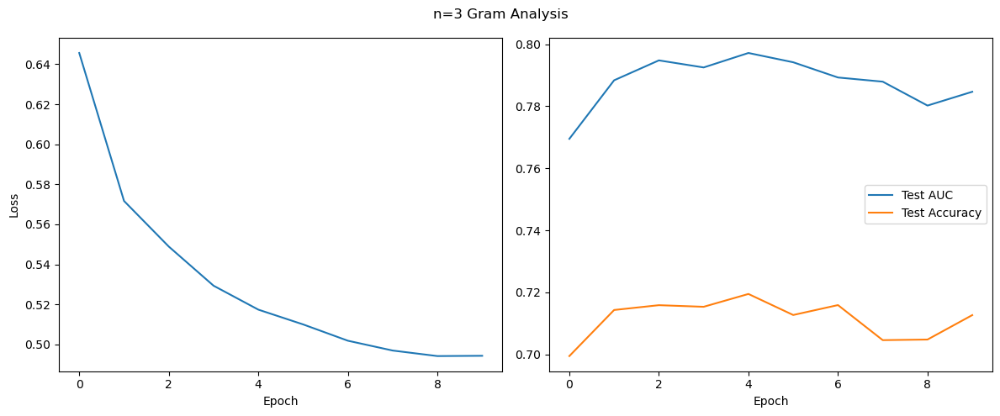


Final Comparison:
n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time
1 | 0.656 | 0.614 | 0.0008 | 8.2s | 1035.9MB | 0.0067s
2 | 0.785 | 0.709 | 0.0016 | 4.2s | 768.9MB | 0.0035s
3 | 0.788 | 0.712 | 0.0020 | 3.3s | 681.8MB | 0.0027s


In [110]:
import time
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score
from collections import defaultdict
import numpy as np
from torch.utils.data import DataLoader

train_ds_subset = create_balanced_subset(train_ds, 8259)

def train_and_evaluate(n_gram, train_data, test_data, num_epochs=10):
    # Set device to GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Initialize a fresh model for each n-gram and move to device
    model = BNFlashTransformer(vocab_size=len(train_data.vocab)).to(device)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    # Metrics storage
    metrics = {
        'train_loss': [],
        'test_auc': [],
        'test_acc': [],
        'epoch_times': [],
        'memory_usage': [],
        'inference_times': []
    }
    
    # DataLoaders with 14 cores
    train_loader = DataLoader(train_data, batch_size=32, collate_fn=pad_collate, num_workers=14)
    test_loader = DataLoader(test_data, batch_size=32, collate_fn=pad_collate, num_workers=14)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        epoch_loss = 0
        
        # Training phase
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            
            # Move inputs and labels to GPU
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Reset memory stats if using GPU
            if torch.cuda.is_available():
                torch.cuda.reset_peak_memory_stats()
            
            start_time = time.time()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item() * inputs.size(0)
            
            # Track memory and inference time per batch
            if torch.cuda.is_available():
                metrics['memory_usage'].append(torch.cuda.max_memory_allocated())
            metrics['inference_times'].append(time.time() - start_time)
        
        # Epoch metrics
        metrics['train_loss'].append(epoch_loss / len(train_data))
        metrics['epoch_times'].append(time.time() - epoch_start)
        
        # Evaluation phase
        model.eval()
        all_labels, all_probs = [], []
        
        with torch.no_grad():
            for inputs, labels in test_loader:
                # Move evaluation batch to GPU
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                start_inf = time.time()
                outputs = model(inputs)
                metrics['inference_times'].append(time.time() - start_inf)
                
                # Convert outputs and labels to CPU for metric calculations
                all_probs.extend(outputs.squeeze().cpu().tolist())
                all_labels.extend(labels.cpu().tolist())
        
        # Convert probabilities to binary predictions
        preds = [1 if p > 0.5 else 0 for p in all_probs]
        
        metrics['test_auc'].append(roc_auc_score(all_labels, all_probs))
        metrics['test_acc'].append(accuracy_score(all_labels, preds))
        
        print(f'n={n_gram} Epoch {epoch+1}: '
              f"Loss={metrics['train_loss'][-1]:.4f}, "
              f"AUC={metrics['test_auc'][-1]:.4f}, "
              f"Acc={metrics['test_acc'][-1]:.4f}")
    
    # Calculate stability (loss variance)
    metrics['stability'] = np.var(metrics['train_loss'])
    
    # Calculate averages
    metrics['avg_train_time'] = np.mean(metrics['epoch_times'])
    metrics['avg_memory'] = np.mean(metrics['memory_usage']) if metrics['memory_usage'] else 0
    metrics['avg_inference'] = np.mean(metrics['inference_times'])
    
    return metrics

def compare_ngrams(ngrams=[1, 2, 3]):
    results = {}
    
    for n in ngrams:
        # Create datasets using the local train_ds and test_ds
        train_data = NGramDataset(train_ds_subset, n=n)
        test_data = NGramDataset(test_ds, n=n, vocab=train_data.vocab)
        
        # Train and evaluate
        results[n] = train_and_evaluate(n, train_data, test_data)
        
        # Plotting
        plt.figure(figsize=(12, 5))
        plt.suptitle(f'n={n} Gram Analysis')
        
        plt.subplot(1, 2, 1)
        plt.plot(results[n]['train_loss'], label='Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        
        plt.subplot(1, 2, 2)
        plt.plot(results[n]['test_auc'], label='Test AUC')
        plt.plot(results[n]['test_acc'], label='Test Accuracy')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    
    # Print comparison table
    print("\nFinal Comparison:")
    print("n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time")
    for n in ngrams:
        print(f"{n} | {np.mean(results[n]['test_auc']):.3f} | "
              f"{np.mean(results[n]['test_acc']):.3f} | "
              f"{results[n]['stability']:.4f} | "
              f"{results[n]['avg_train_time']:.1f}s | "
              f"{results[n]['avg_memory']/1e6:.1f}MB | "
              f"{results[n]['avg_inference']:.4f}s")

# Run comparison
compare_ngrams()

**Batch normalization**: I used batch normalization because I read that the original attention paper required normalization of the embeddings after every layer. So I thought perhaps if I also normalize the embeddings, the performance would improve. And it did, because the 2-ngrams and 3-ngrams had a higher AUC for this model that uses batch normalization and flash attention than the model that doesn't use batch normalization.

n=3 Epoch 1: Loss=45.7275, AUC=0.5000, Acc=0.5000
n=3 Epoch 2: Loss=50.0000, AUC=0.5000, Acc=0.5000
n=3 Epoch 3: Loss=50.0000, AUC=0.5000, Acc=0.5000
n=3 Epoch 4: Loss=50.0000, AUC=0.5000, Acc=0.5000
n=3 Epoch 5: Loss=50.0000, AUC=0.5000, Acc=0.5000
n=3 Epoch 6: Loss=50.0000, AUC=0.5000, Acc=0.5000
n=3 Epoch 7: Loss=50.0000, AUC=0.5000, Acc=0.5000
n=3 Epoch 8: Loss=50.0000, AUC=0.5000, Acc=0.5000
n=3 Epoch 9: Loss=50.0000, AUC=0.5000, Acc=0.5000
n=3 Epoch 10: Loss=50.0000, AUC=0.5000, Acc=0.5000


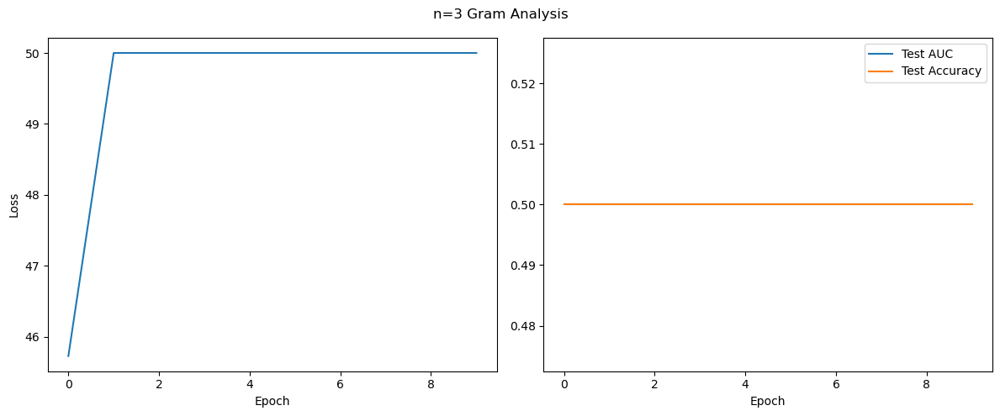


Final Comparison:
n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time
3 | 0.500 | 0.500 | 1.6429 | 6.2s | 1871.1MB | 0.8126s


In [112]:
import time
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score
from collections import defaultdict
import numpy as np
from torch.utils.data import DataLoader

train_ds_subset = create_balanced_subset(train_ds, 8259)

def train_and_evaluate(n_gram, train_data, test_data, num_epochs=10):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = BNFlashTransformer(vocab_size=len(train_data.vocab)).to(device)
    criterion = nn.BCELoss()
    optimizer = torch.optim.LBFGS(model.parameters(), lr=0.01)  # Use L-BFGS optimizer

    metrics = {
        'train_loss': [],
        'test_auc': [],
        'test_acc': [],
        'epoch_times': [],
        'memory_usage': [],
        'inference_times': []
    }

    train_loader = DataLoader(train_data, batch_size=32, collate_fn=pad_collate, num_workers=14)
    test_loader = DataLoader(test_data, batch_size=32, collate_fn=pad_collate, num_workers=14)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        epoch_loss = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            if torch.cuda.is_available():
                torch.cuda.reset_peak_memory_stats()

            def closure():
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs.squeeze(), labels)
                loss.backward()
                return loss

            optimizer.step(closure)
            epoch_loss += closure().item() * inputs.size(0)

            if torch.cuda.is_available():
                metrics['memory_usage'].append(torch.cuda.max_memory_allocated())
            metrics['inference_times'].append(time.time() - epoch_start)

        metrics['train_loss'].append(epoch_loss / len(train_data))
        metrics['epoch_times'].append(time.time() - epoch_start)

        # Evaluation phase
        model.eval()
        all_labels, all_probs = [], []

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                start_inf = time.time()
                outputs = model(inputs)
                metrics['inference_times'].append(time.time() - start_inf)

                all_probs.extend(outputs.squeeze().cpu().tolist())
                all_labels.extend(labels.cpu().tolist())

        preds = [1 if p > 0.5 else 0 for p in all_probs]

        metrics['test_auc'].append(roc_auc_score(all_labels, all_probs))
        metrics['test_acc'].append(accuracy_score(all_labels, preds))

        print(f'n={n_gram} Epoch {epoch+1}: '
              f"Loss={metrics['train_loss'][-1]:.4f}, "
              f"AUC={metrics['test_auc'][-1]:.4f}, "
              f"Acc={metrics['test_acc'][-1]:.4f}")

    metrics['stability'] = np.var(metrics['train_loss'])
    metrics['avg_train_time'] = np.mean(metrics['epoch_times'])
    metrics['avg_memory'] = np.mean(metrics['memory_usage']) if metrics['memory_usage'] else 0
    metrics['avg_inference'] = np.mean(metrics['inference_times'])

    return metrics

def compare_ngrams(ngrams=[3]):
    results = {}
    
    for n in ngrams:
        # Create datasets using the local train_ds and test_ds
        train_data = NGramDataset(train_ds_subset, n=n)
        test_data = NGramDataset(test_ds, n=n, vocab=train_data.vocab)
        
        # Train and evaluate
        results[n] = train_and_evaluate(n, train_data, test_data)
        
        # Plotting
        plt.figure(figsize=(12, 5))
        plt.suptitle(f'n={n} Gram Analysis')
        
        plt.subplot(1, 2, 1)
        plt.plot(results[n]['train_loss'], label='Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        
        plt.subplot(1, 2, 2)
        plt.plot(results[n]['test_auc'], label='Test AUC')
        plt.plot(results[n]['test_acc'], label='Test Accuracy')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    
    # Print comparison table
    print("\nFinal Comparison:")
    print("n | AUC | Accuracy | Stability | Train Time | Memory | Inference Time")
    for n in ngrams:
        print(f"{n} | {np.mean(results[n]['test_auc']):.3f} | "
              f"{np.mean(results[n]['test_acc']):.3f} | "
              f"{results[n]['stability']:.4f} | "
              f"{results[n]['avg_train_time']:.1f}s | "
              f"{results[n]['avg_memory']/1e6:.1f}MB | "
              f"{results[n]['avg_inference']:.4f}s")

# Run comparison
compare_ngrams()

**L-BFGS**: I also tried using a second-order optimizer (L-BFGS) here - this is the same model that uses flash attention and batch normalization. However, this seems to decrease model performance and require a lot of memory. 

### Hyperparameter optimization (30 points)

Sometimes you should be willing to give up some accuracy for portability (requirements - ease of running on consumer-grade hardware or "the edge") and usability (inference time - e.g. in case this would be running as a service).

In this part of the assignments, use a hyperparameter optimization library (preferably optuna) and the subset of the training data to find the best hyperparameters for either the LSTM or the transformer you implemented in the the previous parts of the assignment.

In this part of the assignment, you are aiming to find the best trade-off of accuracy, runtime, and requirements.

You are expected to manipulate the following hyperparameters (not exhaustively):

- Learning rate
- Number of layers/heads
- Hidden states
- Embedding size
- Dropout rate
- Batch normalization

After you have found the best hyperparameters, train the model on the full training dataset and report accuracy, AUC and running time, both for training.

Submissions will be judged based on the following criteria:

- Correctness of code (20 points)
- Training/Inference time and requirements (5 points)
- Total accuracy (5 points)

The latter two will be judged across the whole class.

All code will be tested on Tesla V100s (16GB) - Please do not use larger GPUs for your training



[I 2025-04-05 16:12:34,926] A new study created in memory with name: no-name-75852b33-9bff-4edf-9951-e1651e2068e2
[I 2025-04-05 16:13:22,838] Trial 0 finished with value: 0.6957101005702082 and parameters: {'embed_dim': 256, 'lr': 1.0872605967456928e-05, 'num_heads': 8, 'num_layers': 1, 'dropout': 0.2368494408905639, 'batch_size': 16, 'n_gram': 2}. Best is trial 0 with value: 0.6957101005702082.
[I 2025-04-05 16:15:07,475] Trial 1 finished with value: 0.686435456980304 and parameters: {'embed_dim': 256, 'lr': 0.00046615701839921344, 'num_heads': 4, 'num_layers': 3, 'dropout': 0.195137497615236, 'batch_size': 16, 'n_gram': 2}. Best is trial 0 with value: 0.6957101005702082.
[I 2025-04-05 16:16:46,525] Trial 2 finished with value: 0.6714083071632124 and parameters: {'embed_dim': 128, 'lr': 0.00021078857913816654, 'num_heads': 2, 'num_layers': 3, 'dropout': 0.12788312044847222, 'batch_size': 16, 'n_gram': 1}. Best is trial 0 with value: 0.6957101005702082.
[I 2025-04-05 16:18:19,212] Tria

Epoch 1: Loss=0.6451, AUC=0.7022
Epoch 2: Loss=0.6323, AUC=0.7039
Epoch 3: Loss=0.6295, AUC=0.7083
Epoch 4: Loss=0.6271, AUC=0.7114
Epoch 5: Loss=0.6251, AUC=0.7136
Epoch 6: Loss=0.6238, AUC=0.7124
Epoch 7: Loss=0.6237, AUC=0.7122
Epoch 8: Loss=0.6224, AUC=0.7142
Epoch 9: Loss=0.6226, AUC=0.7159
Epoch 10: Loss=0.6208, AUC=0.7132

Final Results:
- Test AUC: 0.7132
- Accuracy: 0.6545
- Avg Inference Time: 417.9402s/sample


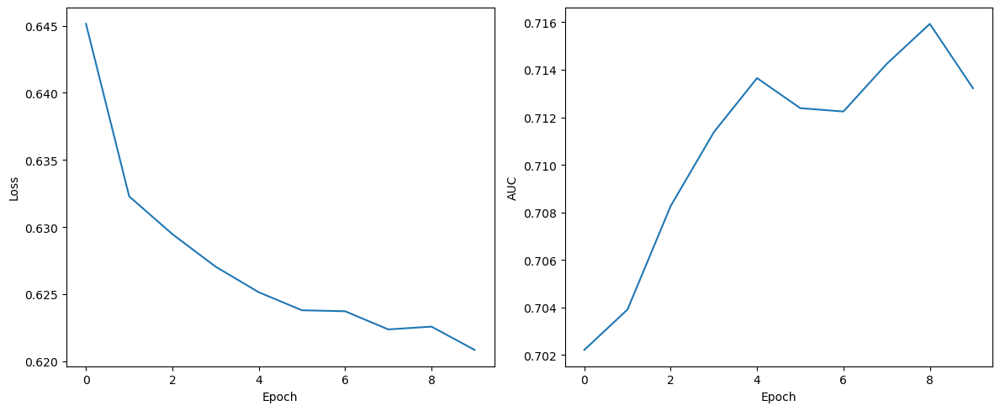

In [56]:
import time
import optuna
import torch
import torch.nn as nn
from performer_pytorch import Performer
import numpy as np
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score

# Padding function
def pad_collate(batch):
    sequences, labels = zip(*batch)
    padded = nn.utils.rnn.pad_sequence(sequences, batch_first=True)
    return padded.long(), torch.tensor(labels, dtype=torch.float32)

def get_hyperparameters(trial):
    # First choose embed_dim and then constrain num_heads to be divisors
    embed_dim = trial.suggest_categorical('embed_dim', [64, 128, 256])
    possible_heads = [h for h in [2, 4, 8] if embed_dim % h == 0]
    
    return {
        'lr': trial.suggest_float('lr', 1e-5, 1e-3, log=True),
        'embed_dim': embed_dim,
        'num_heads': trial.suggest_categorical('num_heads', possible_heads),
        'num_layers': trial.suggest_int('num_layers', 1, 3),
        'dropout': trial.suggest_float('dropout', 0.1, 0.3),
        'batch_size': trial.suggest_categorical('batch_size', [16, 32]),
        'n_gram': trial.suggest_int('n_gram', 1, 2)
    }

class OptimizedTransformer(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, num_heads=4, 
                 num_layers=3, dropout=0.1):
        super().__init__()
        assert embed_dim % num_heads == 0, "Embed dim must be divisible by num_heads"
        
        self.embed = nn.Embedding(vocab_size, embed_dim)
        self.model = Performer(
            dim=embed_dim,
            depth=num_layers,
            heads=num_heads,
            dim_head=embed_dim // num_heads,
            ff_mult=4,
            causal=False
        )
        self.classifier = nn.Sequential(
            nn.Linear(embed_dim, 32),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.embed(x)
        x = self.model(x)
        return self.classifier(x.mean(dim=1))
    
# 3. Objective function for Optuna using train_ds_subset for HPO and test_ds for evaluation.
def objective(trial):
    # Use train_ds_subset for hyperparameter optimization and test_ds for evaluation
    hpo_train = train_ds_subset  
    hpo_test = test_ds
    
    params = get_hyperparameters(trial)
    
    # Create n-gram datasets with current params
    train_data = NGramDataset(hpo_train, n=params['n_gram'])
    test_data = NGramDataset(hpo_test, n=params['n_gram'], vocab=train_data.vocab)
    
    # Set device and move model to GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = OptimizedTransformer(
        vocab_size=len(train_data.vocab),
        embed_dim=params['embed_dim'],
        num_heads=params['num_heads'],
        num_layers=params['num_layers'],
        dropout=params['dropout']
    ).to(device)
    
    # Training setup for HPO
    optimizer = torch.optim.AdamW(model.parameters(), lr=params['lr'])
    criterion = nn.BCELoss()
    train_loader = DataLoader(train_data, batch_size=params['batch_size'], 
                              collate_fn=pad_collate, shuffle=True, num_workers=14)
    
    # Training loop (short for HPO)
    for epoch in range(10):
        model.train()
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()
    
    # Validation
    model.eval()
    all_probs, all_labels = [], []
    test_loader = DataLoader(test_data, batch_size=params['batch_size'], 
                             collate_fn=pad_collate, num_workers=14)
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            all_probs.extend(outputs.squeeze().cpu().tolist())
            all_labels.extend(labels.cpu().tolist())
    
    return roc_auc_score(all_labels, all_probs)

# 4. Run hyperparameter optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5, timeout=3600)

# 5. Train final model with best parameters on full training set (train_ds) and test on test_ds.
best_params = study.best_params
full_train = train_ds  # Use the full balanced training dataset
full_test = test_ds

# Create final datasets
train_data = NGramDataset(full_train, n=best_params['n_gram'])
test_data = NGramDataset(full_test, n=best_params['n_gram'], vocab=train_data.vocab)

# Set device and initialize best model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
final_model = OptimizedTransformer(
    vocab_size=len(train_data.vocab),
    embed_dim=best_params['embed_dim'],
    num_heads=best_params['num_heads'],
    num_layers=best_params['num_layers'],
    dropout=best_params['dropout']
).to(device)

# Training setup for final model
optimizer = torch.optim.AdamW(final_model.parameters(), lr=best_params['lr'])
criterion = nn.BCELoss()
train_loader = DataLoader(train_data, batch_size=best_params['batch_size'], 
                          collate_fn=pad_collate, shuffle=True, num_workers=14)
test_loader = DataLoader(test_data, batch_size=best_params['batch_size'], 
                         collate_fn=pad_collate, num_workers=14)

# Full training loop
train_losses, test_aucs = [], []
for epoch in range(10):
    epoch_loss = 0
    final_model.train()
    
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = final_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    
    # Validation
    final_model.eval()
    all_probs, all_labels = [], []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = final_model(inputs)
            all_probs.extend(outputs.squeeze().cpu().tolist())
            all_labels.extend(labels.cpu().tolist())
    
    auc = roc_auc_score(all_labels, all_probs)
    train_losses.append(epoch_loss / len(train_loader))
    test_aucs.append(auc)
    print(f"Epoch {epoch+1}: Loss={train_losses[-1]:.4f}, AUC={auc:.4f}")

# 6. Final evaluation
preds = [1 if p > 0.5 else 0 for p in all_probs]
final_acc = accuracy_score(all_labels, preds)
print(f"\nFinal Results:")
print(f"- Test AUC: {test_aucs[-1]:.4f}")
print(f"- Accuracy: {final_acc:.4f}")
print(f"- Avg Inference Time: {time.perf_counter()/len(test_data):.4f}s/sample")

# Plot results
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.subplot(1,2,2)
plt.plot(test_aucs, label='Test AUC')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.tight_layout()
plt.show()

### Utilizing SSL models (30 points)

Many times in dailymresearch, you are not required to train these huge models on massive corpa from scratch. Institutions, as well as companies, have been generating models, and data and training them. You can leverage these models to extract useful embeddings for downstream tasks.

In this part of the assignment, you are asked to utilize Evo, a foundation DNA language model to extract embeddings of your positive and negative sequences and then embark on a journey of data exploration.

The original Evo model can be found here: https://github.com/evo-design/evo

#### Import the evo package and successfully run the following example code (5 points):

In [2]:
from evo import Evo
import torch
from transformers import AutoConfig, AutoModelForCausalLM

device = 'cuda:0'

model_name = 'togethercomputer/evo-1-8k-base'

model_config = AutoConfig.from_pretrained(model_name, trust_remote_code=True, revision="1.1_fix")
model_config.use_cache = True

model = AutoModelForCausalLM.from_pretrained(
    model_name,
    config=model_config,
    trust_remote_code=True,
    revision="1.1_fix"
)

model.to(device)
model.eval()

sequence = 'ACGT'
input_ids = torch.tensor(
    tokenizer.tokenize(sequence),
    dtype=torch.int,
).to(device).unsqueeze(0)

with torch.no_grad():
    logits, _ = model(input_ids) # (batch, length, vocab)

print('Logits: ', logits)
print('Shape (batch, length, vocab): ', logits.shape)

config.json:   0%|          | 0.00/1.89k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/togethercomputer/evo-1-131k-base:
- configuration_hyena.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/togethercomputer/evo-1-131k-base:
- utils.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/togethercomputer/evo-1-131k-base:
- layers.py
- utils.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/togethercomputer/evo-1-131k-base:
- cache.py
. Make sure to double-ch

model.safetensors.index.json:   0%|          | 0.00/34.9k [00:00<?, ?B/s]

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.93G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/3.00G [00:00<?, ?B/s]

NameError: name 'init_empty_weights' is not defined

#### Generate embeddings from the model utilizing the subset of your sequences (5 points):

In [15]:
import time
import itertools
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader, Dataset
import umap  # Correct import for UMAP
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import roc_auc_score, accuracy_score
from flash_attn.modules.mha import FlashCrossAttention
from collections import defaultdict
import math

# Assuming create_balanced_subset and train_ds, test_ds are defined elsewhere

# -------------------------------------------------------------------------------------------------------------------------------------------

def create_ngram_vocab(n=3):
    bases = ['A', 'T', 'C', 'G']
    vocab = {"[PAD]": 0, "[UNK]": 1}

    # Generate all possible n-grams
    for combo in itertools.product(bases, repeat=n):
        ngram = ''.join(combo)
        vocab[ngram] = len(vocab)

    return vocab

# -------------------------------------------------------------------------------------------------------------------------------------------

class NGramDataset(Dataset):
    def __init__(self, original_ds, n=3, vocab=None):
        self.n = n
        self.vocab = vocab if vocab else create_ngram_vocab(n)
        self.sequences = []
        self.labels = []

        for seq, label in original_ds:
            # Convert to non-overlapping n-grams
            tokens = [seq[i:i + n] for i in range(0, len(seq) - n + 1, n)]
            # Convert to indices
            indices = [self.vocab.get(tok, self.vocab["[UNK]"]) for tok in tokens]
            self.sequences.append(indices)
            self.labels.append(label)

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return torch.tensor(self.sequences[idx], dtype=torch.long), torch.tensor(self.labels[idx], dtype=torch.float32)

# -------------------------------------------------------------------------------------------------------------------------------------------

def pad_collate(batch):
    sequences, labels = zip(*batch)
    padded = nn.utils.rnn.pad_sequence(sequences, batch_first=True)
    return padded.long(), torch.tensor(labels, dtype=torch.float32)

# -------------------------------------------------------------------------------------------------------------------------------------------

def generate_embeddings(model, dataset, device):
    """
    Generates embeddings from a trained model for a given dataset.

    Args:
        model (nn.Module): The trained model.
        dataset (NGramDataset): The dataset to generate embeddings from.
        device (torch.device): The device to use (CPU or CUDA).

    Returns:
        tuple: A tuple containing embeddings and corresponding labels.
    """
    model.eval()  # Set the model to evaluation mode
    loader = DataLoader(dataset, batch_size=32, collate_fn=pad_collate, num_workers=14)  # Create a DataLoader
    all_embeddings = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for inputs, labels in loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Get the embeddings from the model.
            embeddings = model.get_embeddings(inputs)  # Replace get_embeddings with the appropriate way to get embeddings.

            all_embeddings.append(embeddings.cpu().numpy())
            all_labels.append(labels.cpu().numpy())

    # Concatenate all embeddings and labels
    all_embeddings = np.concatenate(all_embeddings, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)

    return all_embeddings, all_labels

def get_model_and_dataset(n_gram, train_ds_subset, test_ds):
    """
    Creates a model and dataset for a given n-gram.

    Args:
        n_gram (int): The n-gram value.
        train_ds_subset: Subset of training dataset.
        test_ds: Test dataset.
    Returns:
        tuple: A tuple containing the model and the test dataset.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    train_data = NGramDataset(train_ds_subset, n=n_gram)
    test_data = NGramDataset(test_ds, n=n_gram, vocab=train_data.vocab)
    model = BNFlashTransformer(vocab_size=len(train_data.vocab)).to(device)
    return model, test_data, device

def plot_umap(embeddings, labels):
    """
    Plots UMAP visualization of embeddings.

    Args:
        embeddings (np.ndarray): The embeddings.
        labels (np.ndarray): The corresponding labels.
    """
    reducer = umap.UMAP()  # Now correctly references UMAP from umap-learn
    embedding_reduction = reducer.fit_transform(embeddings)

    df = pd.DataFrame(embedding_reduction, columns=['UMAP1', 'UMAP2'])
    df['Label'] = labels

    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='UMAP1', y='UMAP2', hue='Label', data=df, palette='viridis')
    plt.title('UMAP Visualization of Embeddings')
    plt.show()

class BNFlashTransformer(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, num_heads=4):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, embed_dim)
        self.attention = FlashCrossAttention()  # Currently not used in forward; integrate as needed.
        self.pos_encoder = nn.Parameter(torch.randn(1, 1000, embed_dim))  # Max length 1000
        
        # Set batch_first=True to avoid the warning and improve performance.
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            dim_feedforward=512,
            dropout=0.1,
            batch_first=True  # Input/output shape: (batch, seq, embed_dim)
        )
        self.embed_bn = nn.BatchNorm1d(embed_dim)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=3)
        self.classifier = nn.Linear(embed_dim, 1)
    
    def forward(self, x):
        # x is expected to have shape (batch, seq_length)
        x = self.embed(x) 
        # Apply BatchNorm to embeddings (transpose to [batch, embed_dim, seq_length])
        x = x.permute(0, 2, 1)
        x = self.embed_bn(x)
        x = x.permute(0, 2, 1)
        # Add positional encoding
        x = x + self.pos_encoder[:, :x.size(1), :]
        # Transformer encoder
        x = self.transformer(x)
        # Pooling: mean across sequence dimension
        pooled = x.mean(dim=1)
        # Final classification output
        return torch.sigmoid(self.classifier(pooled))
    
    def get_embeddings(self, x):
        # Process x in the same way as in forward to extract embeddings
        x = self.embed(x)
        x = x.permute(0, 2, 1)
        x = self.embed_bn(x)
        x = x.permute(0, 2, 1)
        x = x + self.pos_encoder[:, :x.size(1), :]
        x = self.transformer(x)
        pooled = x.mean(dim=1)
        return pooled

def train_and_evaluate(n_gram, train_data, test_data, num_epochs=10):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = BNFlashTransformer(vocab_size=len(train_data.vocab)).to(device)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    metrics = {
        'train_loss': [],
        'test_auc': [],
        'test_acc': [],
        'epoch_times': [],
        'memory_usage': [],
        'inference_times': []
    }

    train_loader = DataLoader(train_data, batch_size=32, collate_fn=pad_collate, num_workers=14)
    test_loader = DataLoader(test_data, batch_size=32, collate_fn=pad_collate, num_workers=14)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        epoch_loss = 0

        for inputs, labels in train_loader:
            optimizer.zero_grad()
            inputs = inputs.to(device)
            labels = labels.to(device)

            if torch.cuda.is_available():
                torch.cuda.reset_peak_memory_stats()

            start_time = time.time()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item() * inputs.size(0)

            if torch.cuda.is_available():
                metrics['memory_usage'].append(torch.cuda.max_memory_allocated())
            metrics['inference_times'].append(time.time() - start_time)

        metrics['train_loss'].append(epoch_loss / len(train_data))
        metrics['epoch_times'].append(time.time() - epoch_start)

        model.eval()
        all_labels, all_probs = [], []

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                start_inf = time.time()
                outputs = model(inputs)
                metrics['inference_times'].append(time.time() - start_inf)

                all_probs.extend(outputs.squeeze().cpu().tolist())
                all_labels.extend(labels.cpu().tolist())

        preds = [1 if p > 0.5 else 0 for p in all_probs]

        metrics['test_auc'].append(roc_auc_score(all_labels, all_probs))
        metrics['test_acc'].append(accuracy_score(all_labels, preds))

        print(f'n={n_gram} Epoch {epoch + 1}: '
              f"Loss={metrics['train_loss'][-1]:.4f}, "
              f"AUC={metrics['test_auc'][-1]:.4f}, "
              f"Acc={metrics['test_acc'][-1]:.4f}")

    metrics['stability'] = np.var(metrics['train_loss'])
    metrics['avg_train_time'] = np.mean(metrics['epoch_times'])
    metrics['avg_memory'] = np.mean(metrics['memory_usage']) if metrics['memory_usage'] else 0
    metrics['avg_inference'] = np.mean(metrics['inference_times'])

    return metrics

# -------------------------------------------------------------------------------------------------------------------------------------------

train_ds_subset = create_balanced_subset(train_ds, 12872)

n_gram_value = 3  
model, test_data, device = get_model_and_dataset(n_gram_value, train_ds_subset, test_ds)

# Train the model (if needed) - use the train_and_evaluate function you already defined
metrics = train_and_evaluate(n_gram_value, NGramDataset(train_ds_subset, n=n_gram_value), test_data)

n=3 Epoch 1: Loss=0.6374, AUC=0.7792, Acc=0.7106
n=3 Epoch 2: Loss=0.5563, AUC=0.7999, Acc=0.7197
n=3 Epoch 3: Loss=0.5312, AUC=0.8022, Acc=0.7249
n=3 Epoch 4: Loss=0.5178, AUC=0.8050, Acc=0.7268
n=3 Epoch 5: Loss=0.5086, AUC=0.8036, Acc=0.7273
n=3 Epoch 6: Loss=0.5080, AUC=0.8016, Acc=0.7234
n=3 Epoch 7: Loss=0.5007, AUC=0.8038, Acc=0.7266
n=3 Epoch 8: Loss=0.4950, AUC=0.8027, Acc=0.7185
n=3 Epoch 9: Loss=0.4972, AUC=0.7995, Acc=0.7246
n=3 Epoch 10: Loss=0.4955, AUC=0.7960, Acc=0.7176


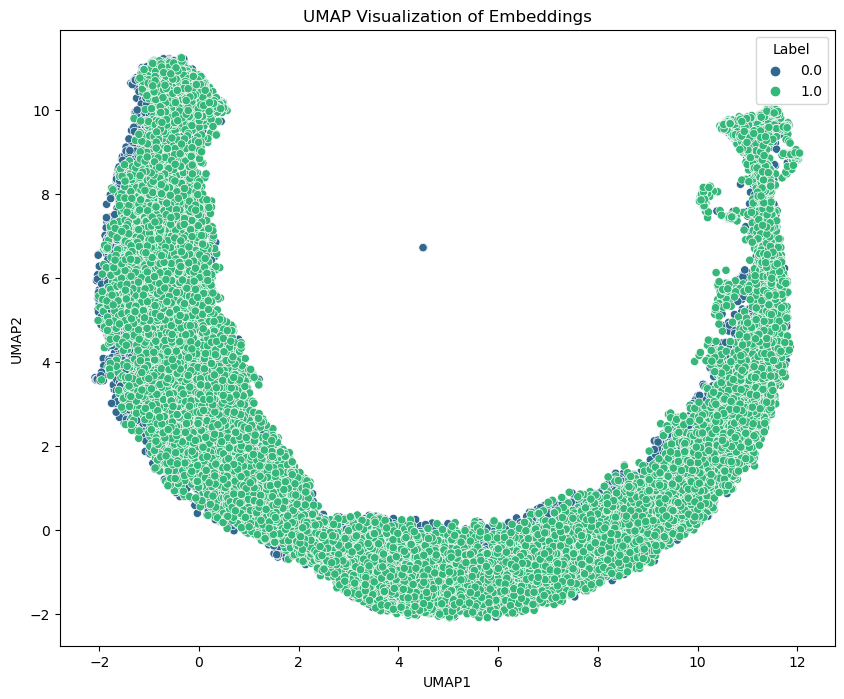

In [16]:
embeddings, labels = generate_embeddings(model, test_data, device)

plot_umap(embeddings, labels)

#### Exploratory analysis (15 points):




Compute a dimensionality reduction of your embeddings, colored by their label. You can use PCA/tSNE/UMAP. Visualize it and comment on cluster segregation. Additionally, for each of your sequences, color each sequence by their dominant n-nucleotide, if that n-nucleotide's counts accounts for above 0.5/n of all dinucleotides. (e.g. if you're doing dinucleotides, you use 0.25, trinucleotides you use 0.5/0.3, tetranucleotides you use 0.125, pentanucleotides 0.1 etc.). Comment on any interesting findings.

/home/ma8308/.local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


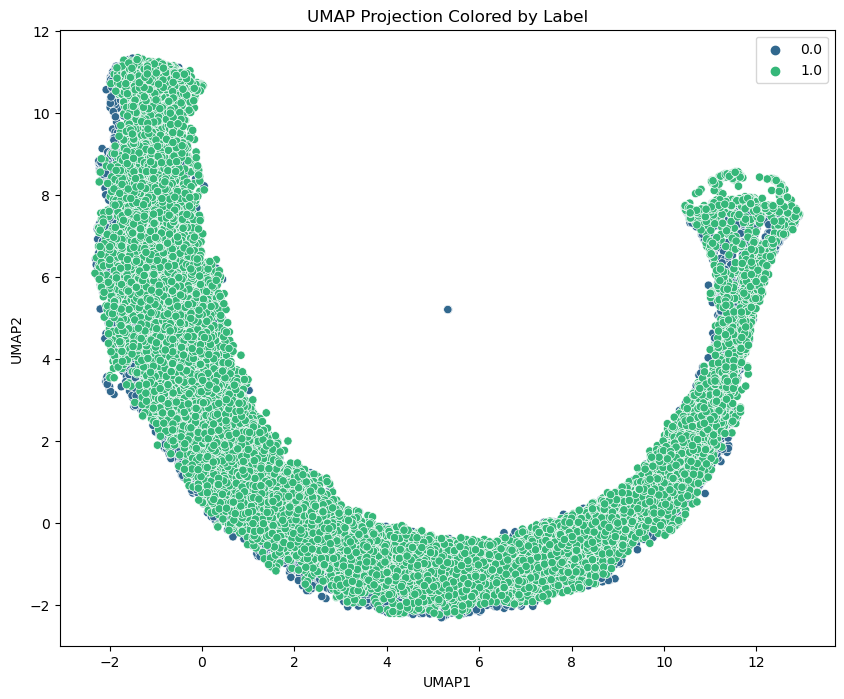

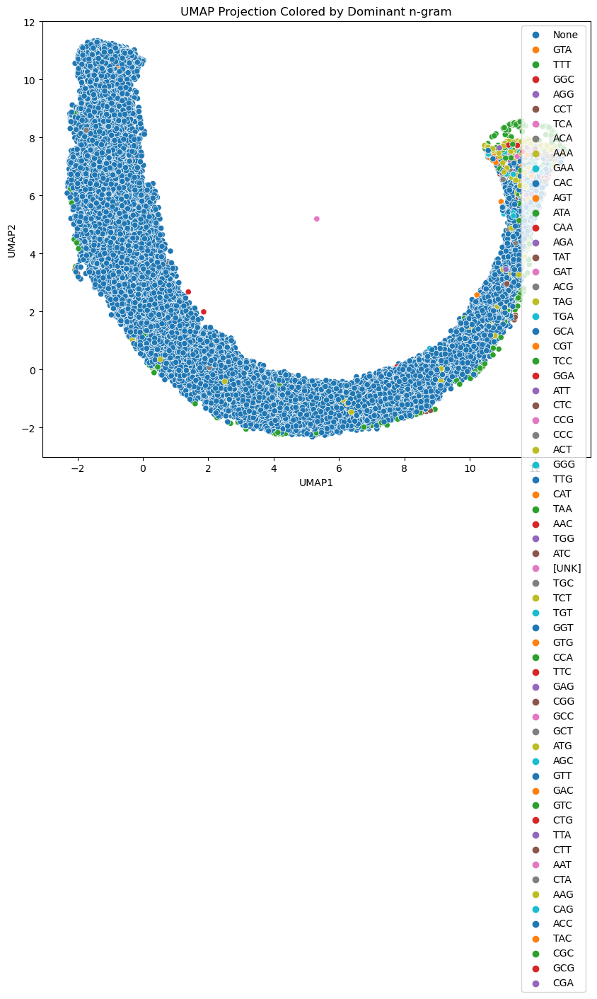

In [17]:
import time
import itertools
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader, Dataset
import umap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.cluster import KMeans
from collections import Counter
import math

# -----------------------
# 1. UMAP Dimensionality Reduction with Two Colorings
# -----------------------

def compute_dominant_ngram(seq_indices, inv_vocab, n, threshold):
    """
    For a given sequence (list of indices), compute the dominant n-gram if
    its frequency is above the threshold. Otherwise, return 'None'.
    """
    counts = Counter(seq_indices)
    seq_len = len(seq_indices)
    dominant = None
    max_freq = 0
    for idx, count in counts.items():
        freq = count / seq_len
        if freq >= threshold and freq > max_freq:
            dominant = inv_vocab[idx]
            max_freq = freq
    return dominant if dominant is not None else "None"

def plot_umap_embeddings(embeddings, labels, dominant_tokens):
    # Reduce dimensionality using UMAP
    reducer = umap.UMAP(random_state=42)
    embedding_reduction = reducer.fit_transform(embeddings)

    # Plot colored by binary label
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=embedding_reduction[:, 0], y=embedding_reduction[:, 1],
                    hue=labels, palette='viridis', legend='full')
    plt.title("UMAP Projection Colored by Label")
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.show()

    # Plot colored by dominant n-gram
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=embedding_reduction[:, 0], y=embedding_reduction[:, 1],
                    hue=dominant_tokens, palette='tab10', legend='full')
    plt.title("UMAP Projection Colored by Dominant n-gram")
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.show()
    
    return embedding_reduction

# -----------------------
# 2. Clustering and Analysis of Dominant n-gram Proportions per Cluster
# -----------------------

def cluster_and_analyze(embeddings, dominant_tokens, n_clusters=4):
    # Use KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(embeddings)
    
    # Plot UMAP colored by clusters
    reducer = umap.UMAP(random_state=42)
    embedding_reduction = reducer.fit_transform(embeddings)
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=embedding_reduction[:, 0], y=embedding_reduction[:, 1],
                    hue=cluster_labels, palette='viridis', legend='full')
    plt.title("UMAP Projection Colored by KMeans Clusters")
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.show()
    
    # Compute proportions of dominant n-grams per cluster
    df_clusters = pd.DataFrame({
        'cluster': cluster_labels,
        'dominant_ngram': dominant_tokens
    })
    
    cluster_props = df_clusters.groupby('cluster')['dominant_ngram'].value_counts(normalize=True)
    cluster_props = cluster_props.rename("proportion").reset_index()
    print("Proportions of dominant n-grams in each cluster:")
    print(cluster_props)
    
    # Plot bar charts for each cluster
    for cluster in sorted(df_clusters['cluster'].unique()):
        subset = cluster_props[cluster_props['cluster'] == cluster]
        plt.figure(figsize=(6, 4))
        sns.barplot(x='dominant_ngram', y='proportion', data=subset, palette='muted')
        plt.title(f"Cluster {cluster}: Dominant n-gram Proportions")
        plt.ylim(0, 1)
        plt.xlabel("Dominant n-gram")
        plt.ylabel("Proportion")
        plt.show()
        
    return cluster_labels

# -----------------------
# 3. MLP Classifier on Top of Embeddings
# -----------------------

class MLPClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, num_layers=2):
        super(MLPClassifier, self).__init__()
        layers = []
        dims = [input_dim] + [hidden_dim] * num_layers
        for i in range(num_layers):
            layers.append(nn.Linear(dims[i], dims[i+1]))
            layers.append(nn.ReLU())
        layers.append(nn.Linear(hidden_dim, 1))
        self.model = nn.Sequential(*layers)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.model(x)
        return self.sigmoid(x)

def train_mlp_on_embeddings(train_embeddings, train_labels, test_embeddings, test_labels, device, num_epochs=20):
    input_dim = train_embeddings.shape[1]
    mlp = MLPClassifier(input_dim).to(device)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(mlp.parameters(), lr=0.001)
    
    # Convert embeddings and labels to tensors
    train_emb_tensor = torch.tensor(train_embeddings, dtype=torch.float32).to(device)
    train_labels_tensor = torch.tensor(train_labels, dtype=torch.float32).to(device)
    test_emb_tensor = torch.tensor(test_embeddings, dtype=torch.float32).to(device)
    test_labels_tensor = torch.tensor(test_labels, dtype=torch.float32).to(device)
    
    print("Training MLP on top of embeddings...")
    start_time = time.time()
    for epoch in range(num_epochs):
        mlp.train()
        optimizer.zero_grad()
        outputs = mlp(train_emb_tensor).squeeze()
        loss = criterion(outputs, train_labels_tensor)
        loss.backward()
        optimizer.step()
        if (epoch + 1) % 5 == 0:
            print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item():.4f}")
    training_time = time.time() - start_time
    
    # Evaluate on test set
    mlp.eval()
    with torch.no_grad():
        test_outputs = mlp(test_emb_tensor).squeeze().cpu().numpy()
    test_preds = (test_outputs > 0.5).astype(int)
    test_labels_np = test_labels_tensor.cpu().numpy()
    acc = accuracy_score(test_labels_np, test_preds)
    auc = roc_auc_score(test_labels_np, test_outputs)
    
    print(f"MLP Test Accuracy: {acc:.4f}")
    print(f"MLP Test AUC: {auc:.4f}")
    print(f"MLP Training Time: {training_time:.2f} seconds")
    
    return mlp, acc, auc, training_time

n_gram_value = 3  # change as needed
model, test_data, device = get_model_and_dataset(n_gram_value, train_ds_subset, test_ds)

embeddings, labels = generate_embeddings(model, test_data, device)

inv_vocab = {idx: token for token, idx in test_data.vocab.items()}
threshold = 0.5 / n_gram_value

# Compute dominant n-gram for each sequence (using the non-overlapping token lists stored in the dataset)
dominant_tokens = []
for seq_tensor, _ in test_data:
    seq_indices = seq_tensor.tolist()  # convert tensor to list of indices
    dom = compute_dominant_ngram(seq_indices, inv_vocab, n_gram_value, threshold)
    dominant_tokens.append(dom)

# Plot UMAPs colored by label and dominant n-gram
umap_coords = plot_umap_embeddings(embeddings, labels, dominant_tokens)

**Interesting comments**: It seems that enhancers and non-enhancers don't cluster too differently, however, the TTT and AAA (which are complimentary, if you think about it), do form some distinct clusters. 

Utilize a clustering algorithm (e.g. K-means, Leiden, H-DBSCAN) to cluster the embeddings. Is the clustering reflected on the UMAP? Plot the proportions of your chosen n-nucleotide in each of the cluster. 

/share/apps/anaconda3/2024.02/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ma8308/.local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


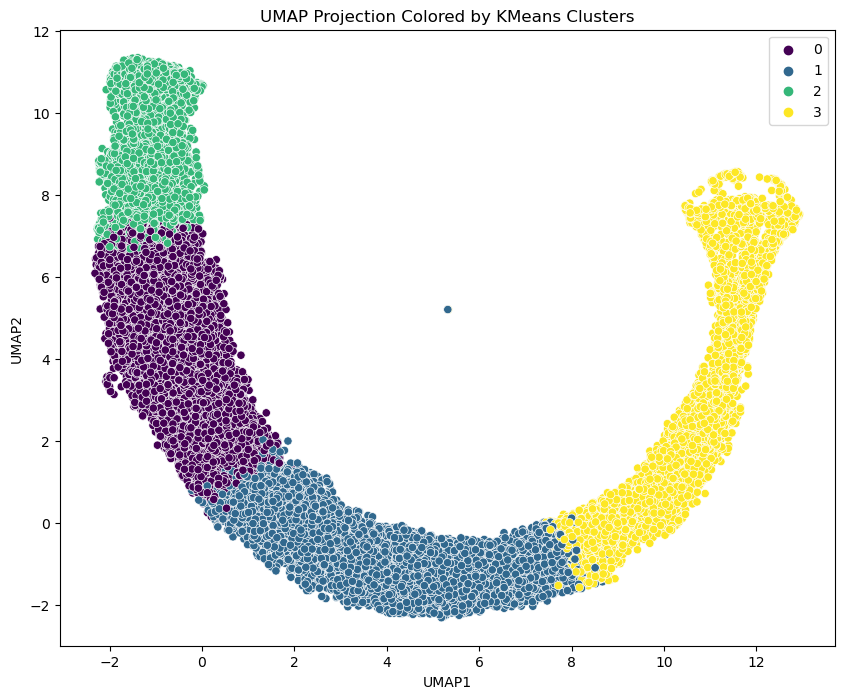

Proportions of dominant n-grams in each cluster:
     cluster dominant_ngram  proportion
0          0           None    0.994526
1          0            TTT    0.001229
2          0            TAT    0.000670
3          0            AAA    0.000559
4          0            GTG    0.000447
..       ...            ...         ...
123        3            CCG    0.000258
124        3            TAC    0.000129
125        3            CGT    0.000129
126        3            ACG    0.000129
127        3            GCG    0.000129

[128 rows x 3 columns]


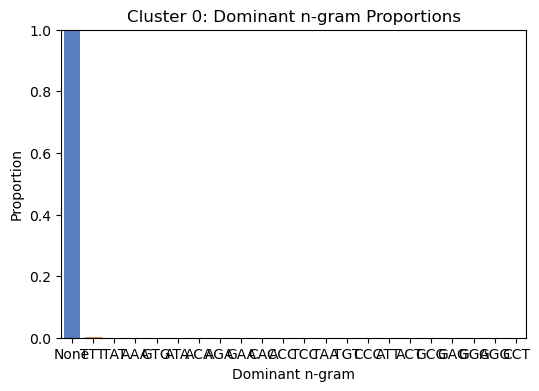

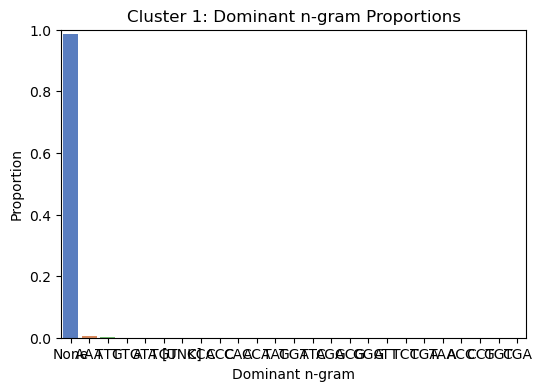

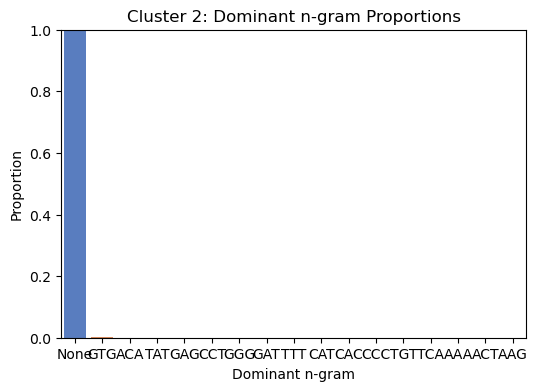

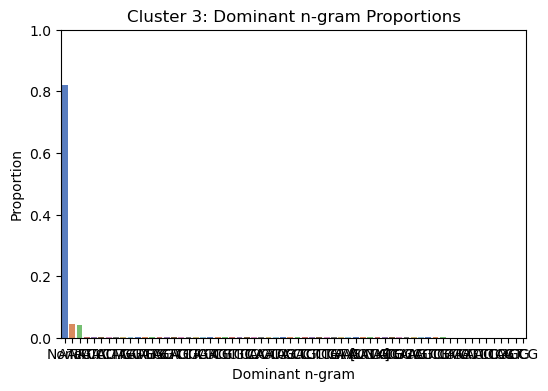

In [18]:
# Cluster the embeddings and analyze dominant n-gram proportions per cluster
cluster_labels = cluster_and_analyze(embeddings, dominant_tokens, n_clusters=4)

#### Train on top of the embeddings (10 points):

Did we even need the pre-trained transformer at all?

Training a multi-layer MLP on top of the embeddings to classify enhancer from non-enhancer sequences. How does it compare to the models you already trained based on accuracy, AUC, runtime and memory requirements?

In [20]:
# Generate embeddings for training data
train_dataset = NGramDataset(train_ds_subset, n=n_gram_value)
train_embeddings, train_labels = generate_embeddings(model, train_dataset, device)

# For a fair comparison, we are now training an MLP on top of these embeddings.
mlp_model, mlp_acc, mlp_auc, mlp_train_time = train_mlp_on_embeddings(
    train_embeddings, train_labels, embeddings, labels, device, num_epochs=20)

Training MLP on top of embeddings...
Epoch 5/20, Loss: 0.6914
Epoch 10/20, Loss: 0.6890
Epoch 15/20, Loss: 0.6855
Epoch 20/20, Loss: 0.6806
MLP Test Accuracy: 0.5992
MLP Test AUC: 0.6410
MLP Training Time: 0.02 seconds


**MLP vs transformer**: The MLP's test AUC is not as great as the batch normalized transformer that uses flash attention. Therefore, I think we did need the transformer model. 